# DL/ML Training

## Setup

In [ ]:
!pip install git+https://github.com/sky1ove/katlas.git -Uqq

In [ ]:
from katlas.core import *
from katlas.train import *
from katlas.plot import *
from katlas.dl import *
from fastbook import *
from sklearn.neighbors import *
from sklearn.linear_model import *
from sklearn.tree import *
from sklearn.svm import *
from sklearn.ensemble import *
from sklearn.multioutput import MultiOutputRegressor
from xgboost import XGBRegressor

In [ ]:
def get_heatmap2(df, # Stacked Dataframe with kinase as index, substrates as columns
                kinase # A specific kinase name in index
               ):
    aa_order = [i for i in 'PGACSTVILMFYWHKRQNDEsty']
    # position_order = [str(i) for i in range(-5,5)]
    # position_order.remove('0')
    
    kk = get_one_kinase(df, kinase,drop_s=False).T
    # kkk = kk.reindex(index=aa_order, columns=position_order)
    kkk = kk.reindex(index=aa_order)
    
    plt.figure(figsize=(6, 10))
    sns.heatmap(kkk, cmap='binary', annot=False)
    plt.title(kinase)

In [ ]:
import seaborn as sns
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
sns.set_context('notebook')
sns.set_style("ticks")

## Data

In [ ]:
t5_kd = pd.read_parquet('raw/combine_t5_kd.parquet').reset_index()

t5 = pd.read_parquet('raw/combine_t5.parquet').reset_index()

esm_kd = pd.read_parquet('raw/combine_esm_kd.parquet').reset_index()

esm = pd.read_parquet('raw/combine_esm.parquet').reset_index()

In [ ]:
t5_col = t5.columns[t5.columns.str.startswith('T5_')]

esm_col = esm.columns[esm.columns.str.startswith('esm_')]
target_col = t5.columns[~t5.columns.isin(t5_col)][1:] # Not include kinase column and final three 0 position
# target_col = t5.columns[~t5.columns.isin(t5_col)][1:-3] # Not include kinase column and final three 0 position

In [ ]:
t5_col,esm_col,target_col

(Index(['T5_0', 'T5_1', 'T5_2', 'T5_3', 'T5_4', 'T5_5', 'T5_6', 'T5_7', 'T5_8',
        'T5_9',
        ...
        'T5_1014', 'T5_1015', 'T5_1016', 'T5_1017', 'T5_1018', 'T5_1019',
        'T5_1020', 'T5_1021', 'T5_1022', 'T5_1023'],
       dtype='object', length=1024),
 Index(['esm_0', 'esm_1', 'esm_2', 'esm_3', 'esm_4', 'esm_5', 'esm_6', 'esm_7',
        'esm_8', 'esm_9',
        ...
        'esm_1270', 'esm_1271', 'esm_1272', 'esm_1273', 'esm_1274', 'esm_1275',
        'esm_1276', 'esm_1277', 'esm_1278', 'esm_1279'],
       dtype='object', length=1280),
 Index(['-5P', '-5G', '-5A', '-5C', '-5S', '-5T', '-5V', '-5I', '-5L', '-5M',
        ...
        '4Q', '4N', '4D', '4E', '4s', '4t', '4y', '0s', '0t', '0y'],
       dtype='object', length=210))

In [ ]:
info = pd.read_excel('raw/freq_combine_info.xlsx')

In [ ]:
info = t5[['kinase']].merge(info)

In [ ]:
info

,kinase,source,ID_coral,uniprot,ID_HGNC,group,family,subfamily_coral,subfamily,in_paper,pseudo,species_paper,uniprot_paper,range,human_uniprot_sequence,full_sequence_paper,sequence,category,category_big,cluster,length,kinasecom_domain,hdbscan
0,SRC,KS,SRC,P12931,SRC,TK,Src,NaN,Src,0,0,human,P12931,Full length,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADGHRGPSAAFAPAAAEPKLFGGFNSSDTVTSPQRAGPLAGGVTTFVALYDYESRTETDLSFKKGERLQIVNNTEGDWWLAHSLSTGQTGYIPSNYVAPSDSIQAEEWYFGKITRRESERLLLNAENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFNSLQQLVAYYSKHADGLCHRLTTVCPTSKPQTQGLAKDAWEIPRESLRLEVKLGQGCFGEVWMGTWNGTTRVAIKTLKPGTMSPEAFLQEAQVMKKLRHEKLVQLYAVVSEEPIYIVTEYMSKGSLLDFLKGETGKYLRLPQLVDMAAQIASGMAYVERMNYVHRDLRAANILVGENLVCKVADFGLARLIEDNEYTARQGAKFPIKWTAPEAALYGRFTIKSDVWSFGILLTELTTKGRVPYPGMVNREVLDQVERGYRMPCPPECPESLHDLMCQCWRKEPEERPTFEYLQAFLEDYFTSTEPQYQPGENL,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADGHRGPSAAFAPAAAEPKLFGGFNSSDTVTSPQRAGPLAGGVTTFVALYDYESRTETDLSFKKGERLQIVNNTEGDWWLAHSLSTGQTGYIPSNYVAPSDSIQAEEWYFGKITRRESERLLLNAENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFNSLQQLVAYYSKHADGLCHRLTTVCPTSKPQTQGLAKDAWEIPRESLRLEVKLGQGCFGEVWMGTWNGTTRVAIKTLKPGTMSPEAFLQEAQVMKKLRHEKLVQLYAVVSEEPIYIVTEYMSKGSLLDFLKGETGKYLRLPQLVDMAAQIASGMAYVERMNYVHRDLRAANILVGENLVCKVADFGLARLIEDNEYTARQGAKFPIKWTAPEAALYGRFTIKSDVWSFGILLTELTTKGRVPYPGMVNREVLDQVERGYRMPCPPECPESLHDLMCQCWRKEPEERPTFEYLQAFLEDYFTSTEPQYQPGENL,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADGHRGPSAAFAPAAAEPKLFGGFNSSDTVTSPQRAGPLAGGVTTFVALYDYESRTETDLSFKKGERLQIVNNTEGDWWLAHSLSTGQTGYIPSNYVAPSDSIQAEEWYFGKITRRESERLLLNAENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFNSLQQLVAYYSKHADGLCHRLTTVCPTSKPQTQGLAKDAWEIPRESLRLEVKLGQGCFGEVWMGTWNGTTRVAIKTLKPGTMSPEAFLQEAQVMKKLRHEKLVQLYAVVSEEPIYIVTEYMSKGSLLDFLKGETGKYLRLPQLVDMAAQIASGMAYVERMNYVHRDLRAANILVGENLVCKVADFGLARLIEDNEYTARQGAKFPIKWTAPEAALYGRFTIKSDVWSFGILLTELTTKGRVPYPGMVNREVLDQVERGYRMPCPPECPESLHDLMCQCWRKEPEERPTFEYLQAFLEDYFTSTEPQYQPGENL,NaN,NaN,NaN,536,LRLEVKLGQGCFGEVWMGTWNGTTRVAIKTLKPGTMSPEAFLQEAQVMKKLRHEKLVQLYAVVSEEPIYIVTEYMSKGSLLDFLKGETGKYLRLPQLVDMAAQIASGMAYVERMNYVHRDLRAANILVGENLVCKVADFGLARLIEDNEYTARQGAKFPIKWTAPEAALYGRFTIKSDVWSFGILLTELTTKGRVPYPGMVNREVLDQVERGYRMPCPPECPESLHDLMCQCWRKEPEERPTFEYLQAF,NaN
1,EPHA3,KS,EphA3,P29320,EPHA3,TK,Eph,NaN,Eph,0,0,human,P29320,Full length,MDCQLSILLLLSCSVLDSFGELIPQPSNEVNLLDSKTIQGELGWISYPSHGWEEISGVDEHYTPIRTYQVCNVMDHSQNNWLRTNWVPRNSAQKIYVELKFTLRDCNSIPLVLGTCKETFNLYYMESDDDHGVKFREHQFTKIDTIAADESFTQMDLGDRILKLNTEIREVGPVNKKGFYLAFQDVGACVALVSVRVYFKKCPFTVKNLAMFPDTVPMDSQSLVEVRGSCVNNSKEEDPPRMYCSTEGEWLVPIGKCSCNAGYEERGFMCQACRPGFYKALDGNMKCAKCPPHSSTQEDGSMNCRCENNYFRADKDPPSMACTRPPSSPRNVISNINETSVILDWSWPLDTGGRKDVTFNIICKKCGWNIKQCEPCSPNVRFLPRQFGLTNTTVTVTDLLAHTNYTFEIDAVNGVSELSSPPRQFAAVSITTNQAAPSPVLTIKKDRTSRNSISLSWQEPEHPNGIILDYEVKYYEKQEQETSYTILRARGTNVTISSLKPDTIYVFQIRARTAAGYGTNSRKFEFETSPDSFSISGESSQVVMIAISAAVAIILLTVVIYVLIGRFCGYKSKHGADEKRLHFGNGHLKLPGLRTY...,MDCQLSILLLLSCSVLDSFGELIPQPSNEVNLLDSKTIQGELGWISYPSHGWEEISGVDEHYTPIRTYQVCNVMDHSQNNWLRTNWVPRNSAQKIYVELKFTLRDCNSIPLVLGTCKETFNLYYMESDDDHGVKFREHQFTKIDTIAADESFTQMDLGDRILKLNTEIREVGPVNKKGFYLAFQDVGACVALVSVRVYFKKCPFTVKNLAMFPDTVPMDSQSLVEVRGSCVNNSKEEDPPRMYCSTEGEWLVPIGKCSCNAGYEERGFMCQACRPGFYKALDGNMKCAKCPPHSSTQEDGSMNCRCENNYFRADKDPPSMACTRPPSSPRNVISNINETSVILDWSWPLDTGGRKDVTFNIICKKCGWNIKQCEPCSPNVRFLPRQFGLTNTTVTVTDLLAHTNYTFEIDAVNGVSELSSPPRQFAAVSITTNQAAPSPVLTIKKDRTSRNSISLSWQEPEHPNGIILDYEVKYYEKQEQETSYTILRARGTNVTISSLKPDTIYVFQIRARTAAGYGTNSRKFEFETSPDSFSISGESSQVVMIAISAAVAIILLTVVIYVLIGRFCGYKSKHGADEKRLHFGNGHLKLPGLRTY...,MDCQLSILLLLSCSVLDSFGELIPQPSNEVNLLDSKTIQGELGWISYPSHGWEEISGVDEHYTPIRTYQVCNVMDHSQNNWLRTNWVPRNSAQKIYVELKFTLRDCNSIPLVLGTCKETFNLYYMESDDDHGVKFREHQFTKIDTIAADESFTQMDLGDRILKLNTEIREVGPVNKKGFYLAFQDVGACVALVSVRVYFKKCPFTVKNLAMFPDTVPMDSQSLVEVRGSCVNNSKEEDPPRMYCSTEGEWLVPIGKCSCNAGYEERGFMCQACRPGFYKALDGNMKCAKCPPHSSTQEDGSMNCRCENNYFRADKDPPSMACTRPPSSPRNVISNINETSVILDWSWPLDTGGRKDVTFNIICKKCGWNIKQCEPCSPNVRFLPRQFGLTNTTVTVTDLLAHTNYTFEIDAVNGVSELSSPPRQFAAVSITTNQAAPSPVLTIKKDRTSRNSISLSWQEPEHPNGIILDYEVKYYEKQEQETSYTILRARGTNVTISSLKPDTIYVFQIRARTAAGYGTNSRKFEFETSPDSFS

In [ ]:
splits = get_splits(info, stratified='group',nfold=5)

StratifiedKFold(n_splits=5, random_state=123, shuffle=True)
# kinase group in train set: 9
# kinase group in test set: 9
---------------------------
# kinase in train set: 312
---------------------------
# kinase in test set: 78
---------------------------
test set: ['NTRK3' 'EPHB2' 'RET' 'TYRO3' 'BMX' 'MST1R' 'FGR' 'LYN' 'TEC' 'EPHA1' 'PDGFRA' 'INSRR' 'BTK' 'EPHA7' 'EGFR' 'FGFR3' 'BUB1B' 'SGK2' 'AKT2' 'ALK2' 'BRSK2' 'BUB1' 'CAMK1A' 'CAMK2B' 'CDK3' 'CDK7' 'CHK2'
 'CK1G3' 'CK2A2' 'CLK3' 'COT' 'ERK5' 'GRK1' 'GSK3B' 'HASPIN' 'IKKB' 'IRAK4' 'MAPKAPK3' 'MARK2' 'MLK2' 'MRCKB' 'MST4' 'P38G' 'P70S6K' 'PAK3' 'PBK' 'PHKG1' 'PIM2' 'PIM3' 'PKACB' 'PKG1' 'PRKD1' 'RSK3'
 'TAO1' 'TAO2' 'TNIK' 'TTBK1' 'WNK3' 'CAMK1G' 'CDC7' 'CDK17' 'CDK18' 'CHAK1' 'CHAK2' 'DMPK1' 'DRAK1' 'DYRK1B' 'GRK6' 'HPK1' 'IRE2' 'MYO3A' 'NEK3' 'NEK8' 'PKN3' 'PLK2' 'RIPK1' 'RIPK2' 'SRPK1']


In [ ]:
len(splits)

5

In [ ]:
y = t5[target_col]

In [ ]:
num_t5 = len(t5_col)
num_esm = len(esm_col)
num_target = len(target_col)

In [ ]:
params = {'n_epoch': 30, 
          'lr_max': 3e-3,
         }

In [ ]:
num_t5,num_esm, num_target

(1024, 1280, 210)

In [ ]:
target_col,esm_col,t5_col

(Index(['-5P', '-5G', '-5A', '-5C', '-5S', '-5T', '-5V', '-5I', '-5L', '-5M',
        ...
        '4Q', '4N', '4D', '4E', '4s', '4t', '4y', '0s', '0t', '0y'],
       dtype='object', length=210),
 Index(['esm_0', 'esm_1', 'esm_2', 'esm_3', 'esm_4', 'esm_5', 'esm_6', 'esm_7',
        'esm_8', 'esm_9',
        ...
        'esm_1270', 'esm_1271', 'esm_1272', 'esm_1273', 'esm_1274', 'esm_1275',
        'esm_1276', 'esm_1277', 'esm_1278', 'esm_1279'],
       dtype='object', length=1280),
 Index(['T5_0', 'T5_1', 'T5_2', 'T5_3', 'T5_4', 'T5_5', 'T5_6', 'T5_7', 'T5_8',
        'T5_9',
        ...
        'T5_1014', 'T5_1015', 'T5_1016', 'T5_1017', 'T5_1018', 'T5_1019',
        'T5_1020', 'T5_1021', 'T5_1022', 'T5_1023'],
       dtype='object', length=1024))

In [ ]:
seed_everything()

In [ ]:
oof_results={} # a dictionary to save oofs for each model

In [ ]:
# oof_results = load_pickle('raw/oofs2.pkl')

## MLP

In [ ]:
def mlp_t5():
    return MLP_1(num_t5, num_target)

------fold0------


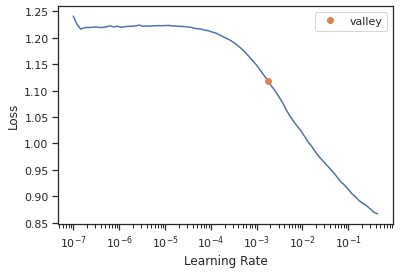

SuggestedLRs(valley=0.001737800776027143)
lr_find is :SuggestedLRs(valley=0.001737800776027143), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.166884,0.994462,0.075496,0.079770,00:00
1,1.066541,0.973180,0.184363,0.184584,00:00
2,0.964968,0.918707,0.356322,0.338389,00:00
3,0.865049,0.846466,0.487175,0.443543,00:00
4,0.780758,0.760031,0.601089,0.529299,00:00
5,0.709782,0.646660,0.671736,0.615483,00:00
6,0.651281,0.556371,0.690672,0.630895,00:00
7,0.600815,0.499038,0.708669,0.648143,00:00
8,0.561137,0.489035,0.715840,0.635398,00:00
9,0.522482,0.467546,0.729881,0.662817,00:00


Better model found at epoch 0 with valid_loss value: 0.9944621324539185.
Better model found at epoch 1 with valid_loss value: 0.9731796383857727.
Better model found at epoch 2 with valid_loss value: 0.9187074303627014.
Better model found at epoch 3 with valid_loss value: 0.8464655876159668.
Better model found at epoch 4 with valid_loss value: 0.7600311040878296.
Better model found at epoch 5 with valid_loss value: 0.646660327911377.
Better model found at epoch 6 with valid_loss value: 0.5563708543777466.
Better model found at epoch 7 with valid_loss value: 0.4990383982658386.
Better model found at epoch 8 with valid_loss value: 0.48903465270996094.
Better model found at epoch 9 with valid_loss value: 0.4675462543964386.
Better model found at epoch 12 with valid_loss value: 0.44727087020874023.
Better model found at epoch 14 with valid_loss value: 0.439677894115448.
Better model found at epoch 15 with valid_loss value: 0.430876225233078.
Better model found at epoch 16 with valid_loss va

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


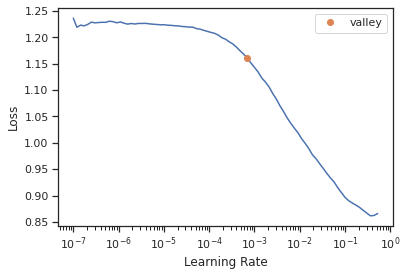

SuggestedLRs(valley=0.0006918309954926372)
lr_find is :SuggestedLRs(valley=0.0006918309954926372), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.154933,1.005858,-0.002475,0.005642,00:00
1,1.054487,0.988402,0.107764,0.100732,00:00
2,0.952558,0.935158,0.306907,0.284979,00:00
3,0.859169,0.862018,0.469949,0.419239,00:00
4,0.777183,0.784836,0.594021,0.523722,00:00
5,0.707122,0.667306,0.655784,0.587510,00:00
6,0.647335,0.578734,0.678485,0.618000,00:00
7,0.593886,0.513597,0.701910,0.643638,00:00
8,0.551298,0.496181,0.709960,0.644045,00:00
9,0.512916,0.512089,0.698628,0.624373,00:00


Better model found at epoch 0 with valid_loss value: 1.0058584213256836.
Better model found at epoch 1 with valid_loss value: 0.9884019494056702.
Better model found at epoch 2 with valid_loss value: 0.9351575970649719.
Better model found at epoch 3 with valid_loss value: 0.8620179891586304.
Better model found at epoch 4 with valid_loss value: 0.7848357558250427.
Better model found at epoch 5 with valid_loss value: 0.6673059463500977.
Better model found at epoch 6 with valid_loss value: 0.5787340998649597.
Better model found at epoch 7 with valid_loss value: 0.5135973691940308.
Better model found at epoch 8 with valid_loss value: 0.4961813986301422.
Better model found at epoch 10 with valid_loss value: 0.4780343472957611.
Better model found at epoch 12 with valid_loss value: 0.46543869376182556.
Better model found at epoch 13 with valid_loss value: 0.45751428604125977.
Better model found at epoch 14 with valid_loss value: 0.44567763805389404.
Better model found at epoch 15 with valid_lo

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


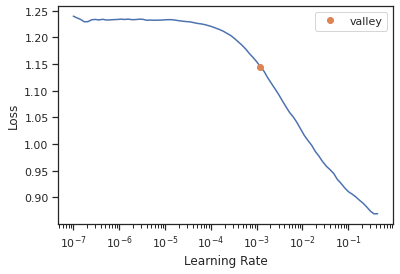

SuggestedLRs(valley=0.0012022644514217973)
lr_find is :SuggestedLRs(valley=0.0012022644514217973), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.169783,1.004003,-0.000752,0.044813,00:00
1,1.077348,0.988073,0.109825,0.135455,00:00
2,0.971957,0.938552,0.302400,0.307717,00:00
3,0.873519,0.874423,0.439705,0.392926,00:00
4,0.789999,0.785383,0.589830,0.504123,00:00
5,0.714048,0.669196,0.657400,0.577990,00:00
6,0.651520,0.578297,0.697355,0.631994,00:00
7,0.599883,0.507622,0.707600,0.637696,00:00
8,0.558744,0.477194,0.723796,0.663006,00:00
9,0.522872,0.457252,0.736735,0.667746,00:00


Better model found at epoch 0 with valid_loss value: 1.0040028095245361.
Better model found at epoch 1 with valid_loss value: 0.9880728125572205.
Better model found at epoch 2 with valid_loss value: 0.9385524392127991.
Better model found at epoch 3 with valid_loss value: 0.8744230270385742.
Better model found at epoch 4 with valid_loss value: 0.7853832244873047.
Better model found at epoch 5 with valid_loss value: 0.6691961884498596.
Better model found at epoch 6 with valid_loss value: 0.5782971382141113.
Better model found at epoch 7 with valid_loss value: 0.5076215267181396.
Better model found at epoch 8 with valid_loss value: 0.4771943688392639.
Better model found at epoch 9 with valid_loss value: 0.45725196599960327.
Better model found at epoch 11 with valid_loss value: 0.45446157455444336.
Better model found at epoch 12 with valid_loss value: 0.44678130745887756.
Better model found at epoch 13 with valid_loss value: 0.4368398189544678.
Better model found at epoch 14 with valid_los

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


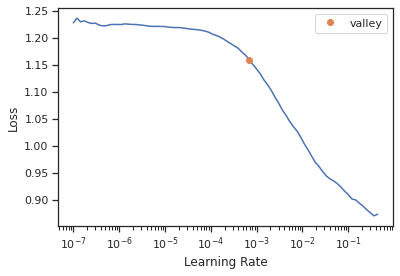

SuggestedLRs(valley=0.0006918309954926372)
lr_find is :SuggestedLRs(valley=0.0006918309954926372), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.161478,0.999065,0.042000,0.044927,00:00
1,1.059210,0.977518,0.160803,0.161981,00:00
2,0.955446,0.922820,0.355853,0.336247,00:00
3,0.864705,0.847286,0.500860,0.441143,00:00
4,0.782423,0.751569,0.634888,0.568491,00:00
5,0.714270,0.647243,0.682688,0.602301,00:00
6,0.653072,0.543468,0.711548,0.636189,00:00
7,0.602749,0.501761,0.723598,0.631894,00:00
8,0.559409,0.449339,0.744699,0.671446,00:00
9,0.523305,0.444716,0.745262,0.669078,00:00


Better model found at epoch 0 with valid_loss value: 0.9990647435188293.
Better model found at epoch 1 with valid_loss value: 0.9775184988975525.
Better model found at epoch 2 with valid_loss value: 0.9228202700614929.
Better model found at epoch 3 with valid_loss value: 0.8472855687141418.
Better model found at epoch 4 with valid_loss value: 0.7515689134597778.
Better model found at epoch 5 with valid_loss value: 0.6472430229187012.
Better model found at epoch 6 with valid_loss value: 0.543468177318573.
Better model found at epoch 7 with valid_loss value: 0.5017610192298889.
Better model found at epoch 8 with valid_loss value: 0.4493393003940582.
Better model found at epoch 9 with valid_loss value: 0.4447156488895416.
Better model found at epoch 11 with valid_loss value: 0.4181070625782013.
Better model found at epoch 12 with valid_loss value: 0.4064077138900757.
Better model found at epoch 14 with valid_loss value: 0.3938378691673279.
Better model found at epoch 16 with valid_loss va

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


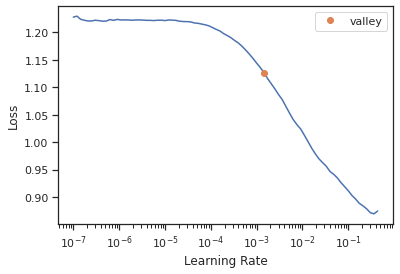

SuggestedLRs(valley=0.0014454397605732083)
lr_find is :SuggestedLRs(valley=0.0014454397605732083), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.162388,0.994108,0.077008,0.077274,00:00
1,1.064361,0.975236,0.167249,0.157853,00:00
2,0.965539,0.926162,0.331037,0.315057,00:00
3,0.876930,0.862068,0.474876,0.436917,00:00
4,0.791911,0.770709,0.605148,0.553962,00:00
5,0.723654,0.666237,0.648270,0.591531,00:00
6,0.665645,0.574459,0.690107,0.617485,00:00
7,0.612862,0.517200,0.707291,0.612886,00:00
8,0.566016,0.488476,0.715292,0.625760,00:00
9,0.526427,0.478638,0.722744,0.625282,00:00


Better model found at epoch 0 with valid_loss value: 0.9941083192825317.
Better model found at epoch 1 with valid_loss value: 0.9752355813980103.
Better model found at epoch 2 with valid_loss value: 0.9261621236801147.
Better model found at epoch 3 with valid_loss value: 0.8620680570602417.
Better model found at epoch 4 with valid_loss value: 0.7707085013389587.
Better model found at epoch 5 with valid_loss value: 0.6662372946739197.
Better model found at epoch 6 with valid_loss value: 0.5744590759277344.
Better model found at epoch 7 with valid_loss value: 0.5172001719474792.
Better model found at epoch 8 with valid_loss value: 0.4884759485721588.
Better model found at epoch 9 with valid_loss value: 0.47863754630088806.
Better model found at epoch 11 with valid_loss value: 0.4500466287136078.
Better model found at epoch 13 with valid_loss value: 0.4424308240413666.
Better model found at epoch 16 with valid_loss value: 0.4387253522872925.
Better model found at epoch 17 with valid_loss 

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3946
Spearman correlation coefficient: 0.6926
Pearson correlation coefficient: 0.7782 
average spearman for each row is 0.6668091391322832
average pearson for each row is 0.7556994076348207
---------- score of OOF ----------------
average spearman for each row is 0.6763356683007863
average pearson for each row is 0.7641035989790158


In [ ]:
oof_mlp, cor_mlp = train_dl_cv(t5,
                               t5_col,
                               target_col, 
                               splits, 
                               mlp_t5, 
                               save = 'mlp_t5',
                               params = params)

In [ ]:
def get_report(cor_mlp):
    out = pd.concat([cor_mlp,info],axis=1)
    print(out.pearson.mean())
    plot_bar(out,'pearson','family',aspect=6)
    plt.show()
    plt.close()

0.7641035989790158


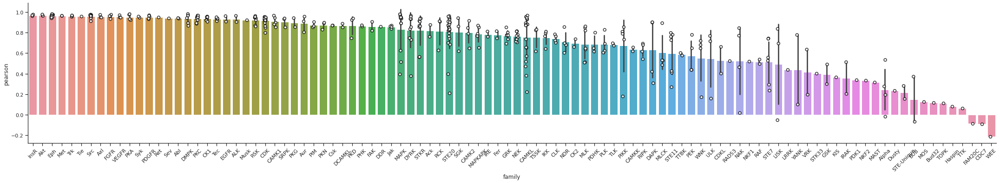

In [ ]:
get_report(cor_mlp)

In [ ]:
oof_mlp.index = info.kinase

In [ ]:
oof_results['mlp_t5'] = oof_mlp

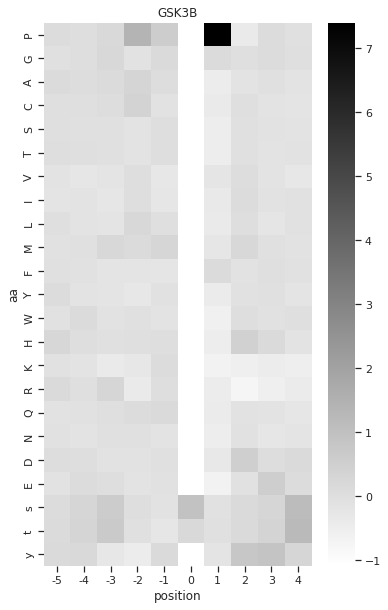

In [ ]:
get_heatmap2(oof_mlp,'GSK3B')

***Kinase Domain***

------fold0------


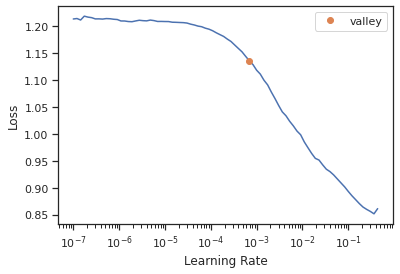

SuggestedLRs(valley=0.0006918309954926372)
lr_find is :SuggestedLRs(valley=0.0006918309954926372), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.134746,0.996011,0.063521,0.036726,00:00
1,1.028632,0.972681,0.180383,0.158662,00:00
2,0.925339,0.910716,0.372677,0.341080,00:00
3,0.834443,0.836332,0.518837,0.459321,00:00
4,0.755303,0.744467,0.630804,0.550708,00:00
5,0.686156,0.631865,0.689802,0.627389,00:00
6,0.630372,0.570999,0.712579,0.635062,00:00
7,0.583970,0.521002,0.700021,0.627349,00:00
8,0.542853,0.477238,0.723315,0.672421,00:00
9,0.510043,0.529512,0.686502,0.599656,00:00


Better model found at epoch 0 with valid_loss value: 0.9960111975669861.
Better model found at epoch 1 with valid_loss value: 0.9726805090904236.
Better model found at epoch 2 with valid_loss value: 0.9107158184051514.
Better model found at epoch 3 with valid_loss value: 0.8363322019577026.
Better model found at epoch 4 with valid_loss value: 0.7444668412208557.
Better model found at epoch 5 with valid_loss value: 0.6318649649620056.
Better model found at epoch 6 with valid_loss value: 0.5709993839263916.
Better model found at epoch 7 with valid_loss value: 0.5210018754005432.
Better model found at epoch 8 with valid_loss value: 0.4772379398345947.
Better model found at epoch 13 with valid_loss value: 0.4589785635471344.
Better model found at epoch 14 with valid_loss value: 0.45679762959480286.
Better model found at epoch 15 with valid_loss value: 0.439505934715271.
Better model found at epoch 16 with valid_loss value: 0.4172791838645935.
Better model found at epoch 17 with valid_loss 

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


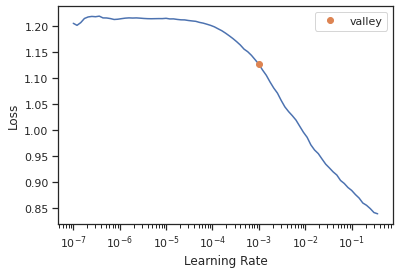

SuggestedLRs(valley=0.0010000000474974513)
lr_find is :SuggestedLRs(valley=0.0010000000474974513), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.133578,1.003604,0.007666,0.004336,00:00
1,1.024129,0.984706,0.126980,0.113441,00:00
2,0.916744,0.922720,0.367147,0.349216,00:00
3,0.822528,0.838357,0.533458,0.503873,00:00
4,0.744472,0.779992,0.606994,0.539772,00:00
5,0.675887,0.664287,0.656598,0.609196,00:00
6,0.621352,0.571075,0.691264,0.635589,00:00
7,0.577356,0.515190,0.699086,0.650284,00:00
8,0.541160,0.530984,0.685090,0.606984,00:00
9,0.510812,0.543697,0.676172,0.590178,00:00


Better model found at epoch 0 with valid_loss value: 1.0036044120788574.
Better model found at epoch 1 with valid_loss value: 0.9847055077552795.
Better model found at epoch 2 with valid_loss value: 0.9227200746536255.
Better model found at epoch 3 with valid_loss value: 0.838356614112854.
Better model found at epoch 4 with valid_loss value: 0.7799922823905945.
Better model found at epoch 5 with valid_loss value: 0.6642870903015137.
Better model found at epoch 6 with valid_loss value: 0.5710747838020325.
Better model found at epoch 7 with valid_loss value: 0.515189528465271.
Better model found at epoch 10 with valid_loss value: 0.4843502640724182.
Better model found at epoch 12 with valid_loss value: 0.48124077916145325.
Better model found at epoch 13 with valid_loss value: 0.4548139274120331.
Better model found at epoch 15 with valid_loss value: 0.4220786392688751.
Better model found at epoch 16 with valid_loss value: 0.4151757061481476.
Better model found at epoch 19 with valid_loss 

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


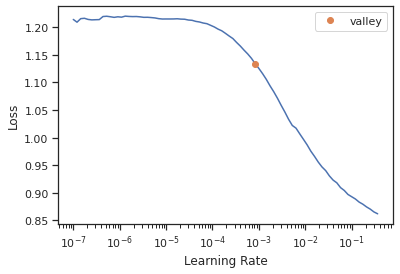

SuggestedLRs(valley=0.0008317637839354575)
lr_find is :SuggestedLRs(valley=0.0008317637839354575), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.146998,0.998956,0.042187,0.035960,00:00
1,1.031868,0.974961,0.175359,0.163306,00:00
2,0.919104,0.916340,0.388808,0.369622,00:00
3,0.826911,0.843219,0.539524,0.493864,00:00
4,0.750238,0.768395,0.630164,0.556198,00:00
5,0.688223,0.669604,0.686045,0.621047,00:00
6,0.635459,0.604343,0.680062,0.612300,00:00
7,0.592396,0.505530,0.720445,0.653626,00:00
8,0.555052,0.483886,0.722422,0.648959,00:00
9,0.519065,0.464076,0.732932,0.662753,00:00


Better model found at epoch 0 with valid_loss value: 0.9989556670188904.
Better model found at epoch 1 with valid_loss value: 0.9749614000320435.
Better model found at epoch 2 with valid_loss value: 0.9163400530815125.
Better model found at epoch 3 with valid_loss value: 0.8432191610336304.
Better model found at epoch 4 with valid_loss value: 0.7683954238891602.
Better model found at epoch 5 with valid_loss value: 0.6696043014526367.
Better model found at epoch 6 with valid_loss value: 0.6043426394462585.
Better model found at epoch 7 with valid_loss value: 0.505529522895813.
Better model found at epoch 8 with valid_loss value: 0.4838855564594269.
Better model found at epoch 9 with valid_loss value: 0.46407607197761536.
Better model found at epoch 10 with valid_loss value: 0.43863242864608765.
Better model found at epoch 14 with valid_loss value: 0.4237949550151825.
Better model found at epoch 15 with valid_loss value: 0.4136497378349304.
Better model found at epoch 16 with valid_loss 

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


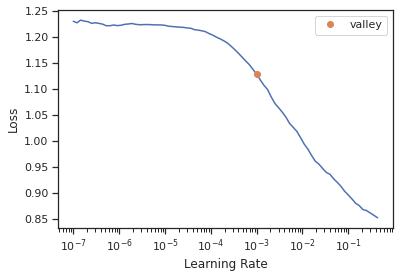

SuggestedLRs(valley=0.0010000000474974513)
lr_find is :SuggestedLRs(valley=0.0010000000474974513), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.132751,0.996141,0.063581,0.064385,00:00
1,1.028327,0.972369,0.193193,0.191778,00:00
2,0.919476,0.913809,0.390810,0.370006,00:00
3,0.835374,0.843532,0.517350,0.452001,00:00
4,0.759783,0.740594,0.637164,0.542458,00:00
5,0.696422,0.647405,0.713525,0.634105,00:00
6,0.644211,0.546332,0.720996,0.648547,00:00
7,0.599726,0.479957,0.732422,0.656581,00:00
8,0.561890,0.445796,0.746561,0.674875,00:00
9,0.528693,0.460334,0.736030,0.625761,00:00


Better model found at epoch 0 with valid_loss value: 0.9961413145065308.
Better model found at epoch 1 with valid_loss value: 0.9723694920539856.
Better model found at epoch 2 with valid_loss value: 0.9138085842132568.
Better model found at epoch 3 with valid_loss value: 0.8435316681861877.
Better model found at epoch 4 with valid_loss value: 0.7405943274497986.
Better model found at epoch 5 with valid_loss value: 0.6474052667617798.
Better model found at epoch 6 with valid_loss value: 0.5463318228721619.
Better model found at epoch 7 with valid_loss value: 0.47995656728744507.
Better model found at epoch 8 with valid_loss value: 0.4457962214946747.
Better model found at epoch 10 with valid_loss value: 0.4400418698787689.
Better model found at epoch 11 with valid_loss value: 0.4199976921081543.
Better model found at epoch 13 with valid_loss value: 0.4161781966686249.
Better model found at epoch 14 with valid_loss value: 0.3814719319343567.
Better model found at epoch 18 with valid_loss

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


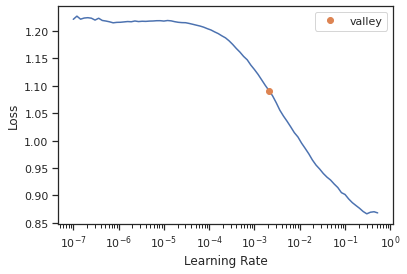

SuggestedLRs(valley=0.0020892962347716093)
lr_find is :SuggestedLRs(valley=0.0020892962347716093), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.135450,0.998403,0.046788,0.044372,00:00
1,1.033165,0.974469,0.171568,0.162330,00:00
2,0.924251,0.910133,0.378953,0.362729,00:00
3,0.833890,0.834495,0.530355,0.482374,00:00
4,0.755184,0.740319,0.654428,0.593776,00:00
5,0.689593,0.628332,0.715412,0.651182,00:00
6,0.633668,0.561941,0.731558,0.640395,00:00
7,0.588981,0.490779,0.726551,0.642601,00:00
8,0.549485,0.455070,0.742657,0.674272,00:00
9,0.517202,0.461946,0.736653,0.662720,00:00


Better model found at epoch 0 with valid_loss value: 0.9984025359153748.
Better model found at epoch 1 with valid_loss value: 0.9744691252708435.
Better model found at epoch 2 with valid_loss value: 0.9101332426071167.
Better model found at epoch 3 with valid_loss value: 0.8344950675964355.
Better model found at epoch 4 with valid_loss value: 0.7403189539909363.
Better model found at epoch 5 with valid_loss value: 0.62833172082901.
Better model found at epoch 6 with valid_loss value: 0.561941385269165.
Better model found at epoch 7 with valid_loss value: 0.4907790422439575.
Better model found at epoch 8 with valid_loss value: 0.4550701677799225.
Better model found at epoch 14 with valid_loss value: 0.41622260212898254.
Better model found at epoch 15 with valid_loss value: 0.40780043601989746.
Better model found at epoch 17 with valid_loss value: 0.3873603045940399.
Better model found at epoch 19 with valid_loss value: 0.378172367811203.
Better model found at epoch 20 with valid_loss va

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3603
Spearman correlation coefficient: 0.7324
Pearson correlation coefficient: 0.7999 
average spearman for each row is 0.7087626023463738
average pearson for each row is 0.7853237153205304
---------- score of OOF ----------------
average spearman for each row is 0.7031328073056827
average pearson for each row is 0.7857777119158713


In [ ]:
oof_mlp, cor_mlp = train_dl_cv(t5_kd,
                               t5_col,
                               target_col, 
                               splits, 
                               mlp_t5, 
                               save = 'mlp_t5_kd',
                               params = params)

0.7857777119158713


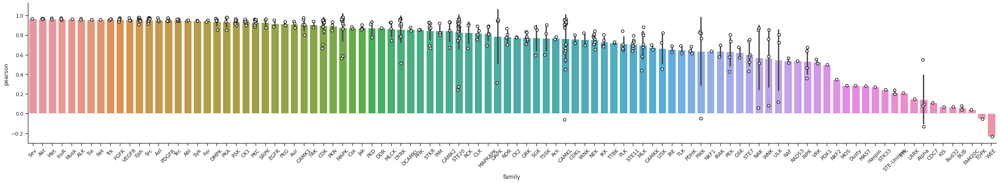

In [ ]:
get_report(cor_mlp)

In [ ]:
oof_mlp.index = info.kinase

In [ ]:
oof_results['mlp_t5_kd'] = oof_mlp

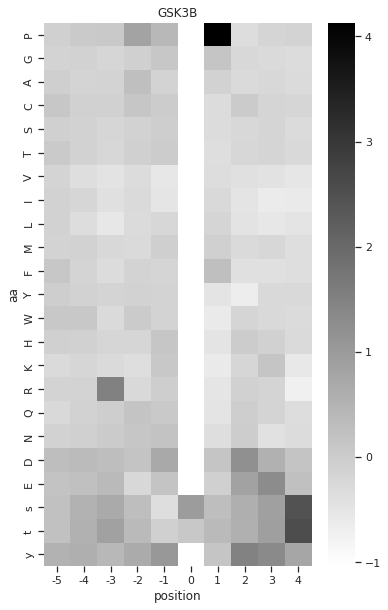

In [ ]:
get_heatmap2(oof_mlp,'GSK3B')

In [ ]:
def mlp_esm():
    return MLP_1(num_esm, num_target)

------fold0------


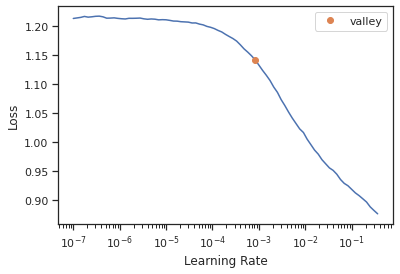

SuggestedLRs(valley=0.0008317637839354575)
lr_find is :SuggestedLRs(valley=0.0008317637839354575), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.147603,0.996408,0.060499,0.066139,00:00
1,1.050664,0.962867,0.224153,0.222440,00:00
2,0.952098,0.873299,0.459328,0.438235,00:00
3,0.865006,0.746845,0.577473,0.527996,00:00
4,0.785943,0.645273,0.637096,0.564038,00:00
5,0.721966,0.567404,0.670616,0.587265,00:00
6,0.667664,0.505733,0.703155,0.634768,00:00
7,0.626887,0.517783,0.695299,0.636783,00:00
8,0.587020,0.481098,0.720436,0.655954,00:00
9,0.552976,0.449502,0.742366,0.683352,00:00


Better model found at epoch 0 with valid_loss value: 0.9964078068733215.
Better model found at epoch 1 with valid_loss value: 0.962867259979248.
Better model found at epoch 2 with valid_loss value: 0.8732985258102417.
Better model found at epoch 3 with valid_loss value: 0.7468448877334595.
Better model found at epoch 4 with valid_loss value: 0.6452727913856506.
Better model found at epoch 5 with valid_loss value: 0.5674044489860535.
Better model found at epoch 6 with valid_loss value: 0.5057328343391418.
Better model found at epoch 8 with valid_loss value: 0.48109808564186096.
Better model found at epoch 9 with valid_loss value: 0.4495018720626831.
Better model found at epoch 12 with valid_loss value: 0.43257635831832886.
Better model found at epoch 13 with valid_loss value: 0.43011802434921265.
Better model found at epoch 14 with valid_loss value: 0.4276137351989746.
Better model found at epoch 15 with valid_loss value: 0.41544973850250244.
Better model found at epoch 17 with valid_lo

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


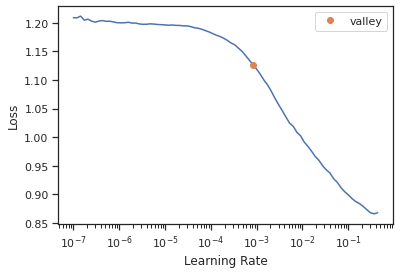

SuggestedLRs(valley=0.0008317637839354575)
lr_find is :SuggestedLRs(valley=0.0008317637839354575), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.131337,0.991329,0.099808,0.086431,00:00
1,1.034090,0.962201,0.239541,0.220271,00:00
2,0.932721,0.876678,0.470969,0.448369,00:00
3,0.841859,0.749239,0.581520,0.551750,00:00
4,0.764781,0.653198,0.618222,0.565739,00:00
5,0.699990,0.580505,0.656532,0.603197,00:00
6,0.646626,0.542646,0.676681,0.624431,00:00
7,0.600767,0.531137,0.686460,0.618081,00:00
8,0.562221,0.565718,0.671930,0.607257,00:00
9,0.532343,0.517790,0.696219,0.616664,00:00


Better model found at epoch 0 with valid_loss value: 0.9913294911384583.
Better model found at epoch 1 with valid_loss value: 0.9622007608413696.
Better model found at epoch 2 with valid_loss value: 0.8766775131225586.
Better model found at epoch 3 with valid_loss value: 0.7492393255233765.
Better model found at epoch 4 with valid_loss value: 0.6531982421875.
Better model found at epoch 5 with valid_loss value: 0.5805050730705261.
Better model found at epoch 6 with valid_loss value: 0.5426456332206726.
Better model found at epoch 7 with valid_loss value: 0.5311373472213745.
Better model found at epoch 9 with valid_loss value: 0.5177900791168213.
Better model found at epoch 11 with valid_loss value: 0.5007215142250061.
Better model found at epoch 12 with valid_loss value: 0.47452256083488464.
Better model found at epoch 13 with valid_loss value: 0.47096922993659973.
Better model found at epoch 14 with valid_loss value: 0.45456451177597046.
Better model found at epoch 15 with valid_loss 

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


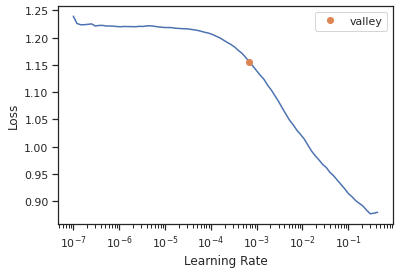

SuggestedLRs(valley=0.0006918309954926372)
lr_find is :SuggestedLRs(valley=0.0006918309954926372), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.159786,0.992049,0.091162,0.107453,00:00
1,1.064461,0.964636,0.215188,0.226422,00:00
2,0.966017,0.881309,0.435818,0.437744,00:00
3,0.874515,0.755737,0.576079,0.542440,00:00
4,0.793458,0.638906,0.656316,0.609085,00:00
5,0.725073,0.590694,0.649407,0.589530,00:00
6,0.671585,0.531373,0.684904,0.626420,00:00
7,0.627134,0.497187,0.709103,0.643587,00:00
8,0.584089,0.513061,0.699127,0.630517,00:00
9,0.546587,0.489793,0.714367,0.644846,00:00


Better model found at epoch 0 with valid_loss value: 0.9920486211776733.
Better model found at epoch 1 with valid_loss value: 0.9646360874176025.
Better model found at epoch 2 with valid_loss value: 0.8813093900680542.
Better model found at epoch 3 with valid_loss value: 0.7557366490364075.
Better model found at epoch 4 with valid_loss value: 0.6389063000679016.
Better model found at epoch 5 with valid_loss value: 0.5906942486763.
Better model found at epoch 6 with valid_loss value: 0.5313730239868164.
Better model found at epoch 7 with valid_loss value: 0.4971872568130493.
Better model found at epoch 9 with valid_loss value: 0.48979294300079346.
Better model found at epoch 10 with valid_loss value: 0.47452446818351746.
Better model found at epoch 11 with valid_loss value: 0.4599377512931824.
Better model found at epoch 12 with valid_loss value: 0.4307205080986023.
Better model found at epoch 14 with valid_loss value: 0.42092767357826233.
Better model found at epoch 17 with valid_loss 

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


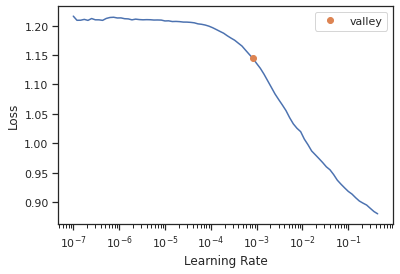

SuggestedLRs(valley=0.0008317637839354575)
lr_find is :SuggestedLRs(valley=0.0008317637839354575), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.149040,1.000268,0.028478,0.020978,00:00
1,1.051439,0.972443,0.198966,0.171666,00:00
2,0.950285,0.883357,0.459088,0.416715,00:00
3,0.864055,0.756261,0.580667,0.519568,00:00
4,0.788234,0.644357,0.649775,0.567363,00:00
5,0.723086,0.575609,0.663777,0.559059,00:00
6,0.664580,0.513020,0.699178,0.617941,00:00
7,0.619722,0.502596,0.705269,0.610149,00:00
8,0.582147,0.501898,0.706172,0.622139,00:00
9,0.547962,0.507168,0.702023,0.599650,00:00


Better model found at epoch 0 with valid_loss value: 1.0002681016921997.
Better model found at epoch 1 with valid_loss value: 0.9724430441856384.
Better model found at epoch 2 with valid_loss value: 0.8833569288253784.
Better model found at epoch 3 with valid_loss value: 0.7562612891197205.
Better model found at epoch 4 with valid_loss value: 0.6443566083908081.
Better model found at epoch 5 with valid_loss value: 0.5756090879440308.
Better model found at epoch 6 with valid_loss value: 0.5130197405815125.
Better model found at epoch 7 with valid_loss value: 0.502596378326416.
Better model found at epoch 8 with valid_loss value: 0.5018975138664246.
Better model found at epoch 11 with valid_loss value: 0.44958046078681946.
Better model found at epoch 14 with valid_loss value: 0.43512406945228577.
Better model found at epoch 17 with valid_loss value: 0.4274422526359558.
Better model found at epoch 18 with valid_loss value: 0.42465776205062866.
Better model found at epoch 19 with valid_los

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


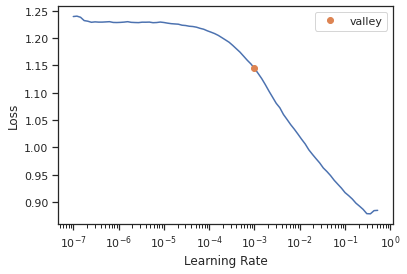

SuggestedLRs(valley=0.0010000000474974513)
lr_find is :SuggestedLRs(valley=0.0010000000474974513), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.157784,0.997700,0.050857,0.040096,00:00
1,1.061861,0.967318,0.213620,0.193108,00:00
2,0.958592,0.879670,0.476487,0.444556,00:00
3,0.870198,0.745272,0.599066,0.552238,00:00
4,0.789578,0.625665,0.666439,0.607467,00:00
5,0.726373,0.576922,0.668600,0.567643,00:00
6,0.670265,0.571809,0.654388,0.552854,00:00
7,0.631462,0.520195,0.693009,0.594823,00:00
8,0.589816,0.510263,0.700490,0.628691,00:00
9,0.550316,0.479159,0.722412,0.642527,00:00


Better model found at epoch 0 with valid_loss value: 0.9977003931999207.
Better model found at epoch 1 with valid_loss value: 0.9673182368278503.
Better model found at epoch 2 with valid_loss value: 0.8796699643135071.
Better model found at epoch 3 with valid_loss value: 0.7452720999717712.
Better model found at epoch 4 with valid_loss value: 0.625665009021759.
Better model found at epoch 5 with valid_loss value: 0.5769224166870117.
Better model found at epoch 6 with valid_loss value: 0.5718086361885071.
Better model found at epoch 7 with valid_loss value: 0.5201945304870605.
Better model found at epoch 8 with valid_loss value: 0.5102627873420715.
Better model found at epoch 9 with valid_loss value: 0.47915923595428467.
Better model found at epoch 11 with valid_loss value: 0.4614853858947754.
Better model found at epoch 14 with valid_loss value: 0.4404681622982025.
Better model found at epoch 15 with valid_loss value: 0.4354347288608551.
Better model found at epoch 17 with valid_loss v

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.4031
Spearman correlation coefficient: 0.6829
Pearson correlation coefficient: 0.7731 
average spearman for each row is 0.6606244783757277
average pearson for each row is 0.7552419556724984
---------- score of OOF ----------------
average spearman for each row is 0.6717558650994376
average pearson for each row is 0.76104320502638


In [ ]:
oof_mlp, cor_mlp = train_dl_cv(esm,
                               esm_col,
                               target_col, 
                               splits, 
                               mlp_esm, 
                               save = 'mlp_esm',
                               params = params)

0.76104320502638


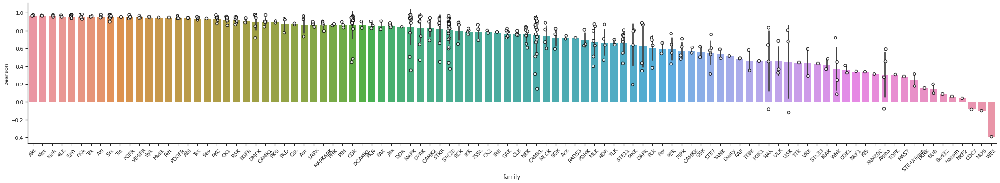

In [ ]:
get_report(cor_mlp)

In [ ]:
oof_mlp.index = info.kinase

In [ ]:
oof_results['mlp_esm'] = oof_mlp

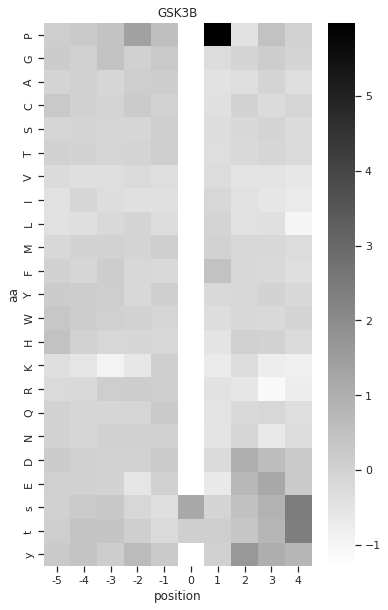

In [ ]:
get_heatmap2(oof_mlp,'GSK3B')

------fold0------


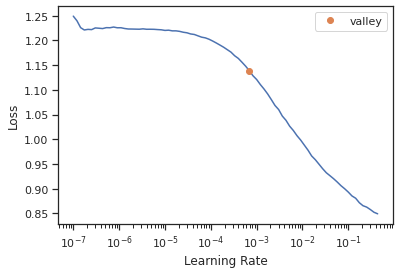

SuggestedLRs(valley=0.0006918309954926372)
lr_find is :SuggestedLRs(valley=0.0006918309954926372), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.124270,0.993006,0.084325,0.060788,00:00
1,1.019526,0.951176,0.271648,0.235436,00:00
2,0.916302,0.830259,0.528857,0.496206,00:00
3,0.832404,0.683357,0.623939,0.583224,00:00
4,0.755314,0.586849,0.682622,0.618066,00:00
5,0.693033,0.548471,0.677975,0.586465,00:00
6,0.642555,0.518741,0.693753,0.618580,00:00
7,0.602118,0.487083,0.721207,0.664919,00:00
8,0.562588,0.466242,0.732658,0.680803,00:00
9,0.528772,0.458839,0.735656,0.675801,00:00


Better model found at epoch 0 with valid_loss value: 0.9930059909820557.
Better model found at epoch 1 with valid_loss value: 0.9511758685112.
Better model found at epoch 2 with valid_loss value: 0.8302589654922485.
Better model found at epoch 3 with valid_loss value: 0.6833568215370178.
Better model found at epoch 4 with valid_loss value: 0.5868485569953918.
Better model found at epoch 5 with valid_loss value: 0.5484712719917297.
Better model found at epoch 6 with valid_loss value: 0.5187408328056335.
Better model found at epoch 7 with valid_loss value: 0.4870825409889221.
Better model found at epoch 8 with valid_loss value: 0.4662416875362396.
Better model found at epoch 9 with valid_loss value: 0.45883896946907043.
Better model found at epoch 10 with valid_loss value: 0.4243345558643341.
Better model found at epoch 14 with valid_loss value: 0.4151638150215149.
Better model found at epoch 15 with valid_loss value: 0.40864747762680054.
Better model found at epoch 17 with valid_loss va

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


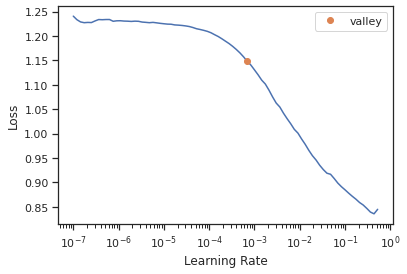

SuggestedLRs(valley=0.0006918309954926372)
lr_find is :SuggestedLRs(valley=0.0006918309954926372), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.144942,0.993328,0.086602,0.089892,00:00
1,1.038291,0.956087,0.283273,0.270159,00:00
2,0.928850,0.846569,0.525779,0.493050,00:00
3,0.834089,0.710743,0.615302,0.579129,00:00
4,0.754360,0.597562,0.664937,0.627727,00:00
5,0.690091,0.551757,0.680117,0.622165,00:00
6,0.636832,0.519813,0.693595,0.631699,00:00
7,0.595359,0.502851,0.707194,0.648377,00:00
8,0.561237,0.493542,0.711666,0.651129,00:00
9,0.528436,0.517212,0.695026,0.627006,00:00


Better model found at epoch 0 with valid_loss value: 0.9933279156684875.
Better model found at epoch 1 with valid_loss value: 0.9560867547988892.
Better model found at epoch 2 with valid_loss value: 0.8465685844421387.
Better model found at epoch 3 with valid_loss value: 0.7107429504394531.
Better model found at epoch 4 with valid_loss value: 0.5975618362426758.
Better model found at epoch 5 with valid_loss value: 0.5517570972442627.
Better model found at epoch 6 with valid_loss value: 0.5198125839233398.
Better model found at epoch 7 with valid_loss value: 0.5028507113456726.
Better model found at epoch 8 with valid_loss value: 0.49354246258735657.
Better model found at epoch 10 with valid_loss value: 0.4722962975502014.
Better model found at epoch 11 with valid_loss value: 0.454241544008255.
Better model found at epoch 12 with valid_loss value: 0.437917560338974.
Better model found at epoch 14 with valid_loss value: 0.41818681359291077.
Better model found at epoch 17 with valid_loss 

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


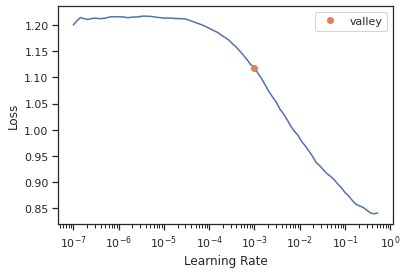

SuggestedLRs(valley=0.0010000000474974513)
lr_find is :SuggestedLRs(valley=0.0010000000474974513), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.123390,0.993640,0.080183,0.078425,00:00
1,1.014006,0.949998,0.275368,0.252087,00:00
2,0.908456,0.829363,0.532039,0.511569,00:00
3,0.821355,0.695977,0.621750,0.582221,00:00
4,0.750873,0.577369,0.678726,0.633734,00:00
5,0.690780,0.538086,0.683338,0.625129,00:00
6,0.641640,0.501582,0.706629,0.659295,00:00
7,0.601642,0.514266,0.697226,0.640200,00:00
8,0.562916,0.462047,0.734075,0.664099,00:00
9,0.529986,0.464639,0.731702,0.661135,00:00


Better model found at epoch 0 with valid_loss value: 0.9936402440071106.
Better model found at epoch 1 with valid_loss value: 0.9499977231025696.
Better model found at epoch 2 with valid_loss value: 0.8293627500534058.
Better model found at epoch 3 with valid_loss value: 0.6959770917892456.
Better model found at epoch 4 with valid_loss value: 0.5773690342903137.
Better model found at epoch 5 with valid_loss value: 0.5380860567092896.
Better model found at epoch 6 with valid_loss value: 0.5015819072723389.
Better model found at epoch 8 with valid_loss value: 0.462047278881073.
Better model found at epoch 10 with valid_loss value: 0.4575219750404358.
Better model found at epoch 12 with valid_loss value: 0.4168378412723541.
Better model found at epoch 13 with valid_loss value: 0.41121575236320496.
Better model found at epoch 16 with valid_loss value: 0.39927271008491516.
Better model found at epoch 17 with valid_loss value: 0.396965354681015.
Better model found at epoch 18 with valid_loss

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


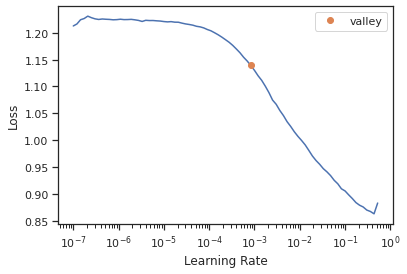

SuggestedLRs(valley=0.0008317637839354575)
lr_find is :SuggestedLRs(valley=0.0008317637839354575), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.145149,0.997181,0.053978,0.063795,00:00
1,1.037154,0.962314,0.240873,0.224495,00:00
2,0.933266,0.858468,0.494756,0.450675,00:00
3,0.839974,0.710654,0.616232,0.551507,00:00
4,0.764989,0.584277,0.697252,0.607159,00:00
5,0.700449,0.519714,0.715584,0.637001,00:00
6,0.648854,0.485369,0.719933,0.653523,00:00
7,0.603701,0.509520,0.702547,0.597443,00:00
8,0.566538,0.466218,0.730908,0.626036,00:00
9,0.534195,0.477279,0.723487,0.642721,00:00


Better model found at epoch 0 with valid_loss value: 0.9971805214881897.
Better model found at epoch 1 with valid_loss value: 0.962313711643219.
Better model found at epoch 2 with valid_loss value: 0.8584675788879395.
Better model found at epoch 3 with valid_loss value: 0.7106536030769348.
Better model found at epoch 4 with valid_loss value: 0.584276556968689.
Better model found at epoch 5 with valid_loss value: 0.5197136402130127.
Better model found at epoch 6 with valid_loss value: 0.4853689670562744.
Better model found at epoch 8 with valid_loss value: 0.46621766686439514.
Better model found at epoch 10 with valid_loss value: 0.45538339018821716.
Better model found at epoch 11 with valid_loss value: 0.421151340007782.
Better model found at epoch 12 with valid_loss value: 0.4001366198062897.
Better model found at epoch 13 with valid_loss value: 0.4001336097717285.
Better model found at epoch 14 with valid_loss value: 0.3811272978782654.
Better model found at epoch 16 with valid_loss 

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


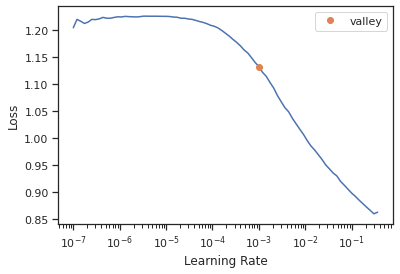

SuggestedLRs(valley=0.0010000000474974513)
lr_find is :SuggestedLRs(valley=0.0010000000474974513), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.140405,0.999126,0.039436,0.023324,00:00
1,1.040706,0.959624,0.252426,0.208976,00:00
2,0.934234,0.842496,0.540079,0.488665,00:00
3,0.841376,0.692160,0.642548,0.587072,00:00
4,0.767215,0.588037,0.690975,0.628692,00:00
5,0.700591,0.541888,0.695429,0.597045,00:00
6,0.646174,0.488480,0.717446,0.634110,00:00
7,0.604880,0.486178,0.718417,0.639997,00:00
8,0.570173,0.493560,0.715115,0.640886,00:00
9,0.535428,0.469369,0.728774,0.640368,00:00


Better model found at epoch 0 with valid_loss value: 0.999126136302948.
Better model found at epoch 1 with valid_loss value: 0.9596240520477295.
Better model found at epoch 2 with valid_loss value: 0.8424959182739258.
Better model found at epoch 3 with valid_loss value: 0.6921596527099609.
Better model found at epoch 4 with valid_loss value: 0.5880374312400818.
Better model found at epoch 5 with valid_loss value: 0.5418882369995117.
Better model found at epoch 6 with valid_loss value: 0.4884799122810364.
Better model found at epoch 7 with valid_loss value: 0.48617807030677795.
Better model found at epoch 9 with valid_loss value: 0.46936875581741333.
Better model found at epoch 11 with valid_loss value: 0.43808412551879883.
Better model found at epoch 13 with valid_loss value: 0.41729629039764404.
Better model found at epoch 14 with valid_loss value: 0.4138006567955017.
Better model found at epoch 15 with valid_loss value: 0.407046914100647.
Better model found at epoch 16 with valid_los

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3560
Spearman correlation coefficient: 0.7279
Pearson correlation coefficient: 0.8027 
average spearman for each row is 0.703288066751193
average pearson for each row is 0.7873645630094545
---------- score of OOF ----------------
average spearman for each row is 0.704144491020447
average pearson for each row is 0.7869613651499301


In [ ]:
oof_mlp, cor_mlp = train_dl_cv(esm_kd,
                               esm_col,
                               target_col, 
                               splits, 
                               mlp_esm, 
                               save = 'mlp_esm_kd',
                               params = params)

0.7869613651499301


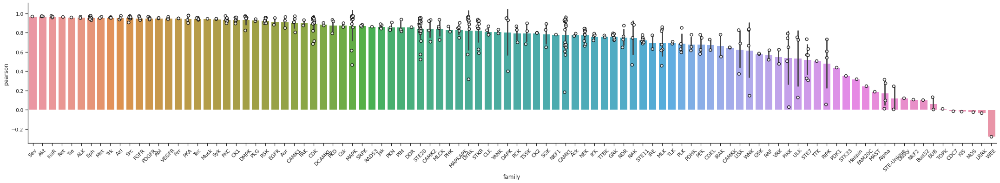

In [ ]:
get_report(cor_mlp)

In [ ]:
oof_mlp.index = info.kinase

In [ ]:
oof_results['mlp_esm_kd'] = oof_mlp

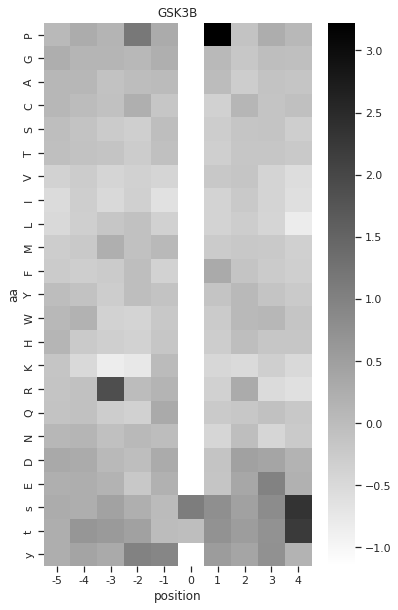

In [ ]:
get_heatmap2(oof_mlp,'GSK3B')

## 1DCNN

In [ ]:
def cnn_t5():
    return CNN1D_2(num_t5, num_target)

------fold0------


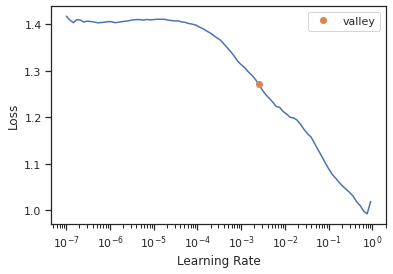

SuggestedLRs(valley=0.002511886414140463)
lr_find is :SuggestedLRs(valley=0.002511886414140463), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.360139,0.996958,0.057922,0.060965,00:00
1,1.237837,0.984711,0.123832,0.090397,00:00
2,1.117308,0.977117,0.184748,0.132849,00:01
3,1.019104,1.167621,0.166832,0.123153,00:00
4,0.936698,0.923471,0.314650,0.270662,00:00
5,0.862651,0.939831,0.352889,0.335607,00:00
6,0.791476,0.607174,0.630204,0.576810,00:00
7,0.722196,0.590465,0.658658,0.582336,00:00
8,0.659415,0.520362,0.712370,0.630603,00:00
9,0.600374,0.522055,0.724577,0.642508,00:00


Better model found at epoch 0 with valid_loss value: 0.9969576597213745.
Better model found at epoch 1 with valid_loss value: 0.9847112894058228.
Better model found at epoch 2 with valid_loss value: 0.977116584777832.
Better model found at epoch 4 with valid_loss value: 0.9234713912010193.
Better model found at epoch 6 with valid_loss value: 0.6071738004684448.
Better model found at epoch 7 with valid_loss value: 0.5904653668403625.
Better model found at epoch 8 with valid_loss value: 0.520361602306366.
Better model found at epoch 10 with valid_loss value: 0.49099305272102356.
Better model found at epoch 11 with valid_loss value: 0.44222211837768555.
Better model found at epoch 12 with valid_loss value: 0.4374295175075531.
Better model found at epoch 13 with valid_loss value: 0.43586599826812744.
Better model found at epoch 14 with valid_loss value: 0.4153693616390228.
Better model found at epoch 15 with valid_loss value: 0.41459333896636963.
Better model found at epoch 16 with valid_l

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3812
Spearman correlation coefficient: 0.7252
Pearson correlation coefficient: 0.7910 
average spearman for each row is 0.690120682385926
average pearson for each row is 0.7718272882320435
------fold1------


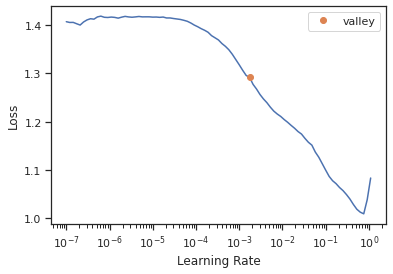

SuggestedLRs(valley=0.001737800776027143)
lr_find is :SuggestedLRs(valley=0.001737800776027143), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.339224,0.998970,0.045767,0.007494,00:00
1,1.221091,0.982772,0.131420,0.080472,00:01
2,1.103074,1.022136,0.166511,0.086405,00:00
3,1.002600,1.089643,0.175391,0.125255,00:00
4,0.922646,1.022006,0.301121,0.267273,00:00
5,0.859757,0.720958,0.528874,0.481031,00:00
6,0.788355,0.632356,0.610203,0.548804,00:00
7,0.723850,0.593345,0.657372,0.596667,00:00
8,0.666390,0.617194,0.651516,0.578295,00:00
9,0.614418,0.600223,0.676196,0.616126,00:00


Better model found at epoch 0 with valid_loss value: 0.9989704489707947.
Better model found at epoch 1 with valid_loss value: 0.9827723503112793.
Better model found at epoch 5 with valid_loss value: 0.7209582924842834.
Better model found at epoch 6 with valid_loss value: 0.6323562264442444.
Better model found at epoch 7 with valid_loss value: 0.5933451056480408.
Better model found at epoch 10 with valid_loss value: 0.5409199595451355.
Better model found at epoch 11 with valid_loss value: 0.4836275279521942.
Better model found at epoch 13 with valid_loss value: 0.435027152299881.
Better model found at epoch 15 with valid_loss value: 0.42322996258735657.
Better model found at epoch 17 with valid_loss value: 0.41875770688056946.
Better model found at epoch 18 with valid_loss value: 0.41743817925453186.
Better model found at epoch 19 with valid_loss value: 0.40015876293182373.
Better model found at epoch 20 with valid_loss value: 0.39934030175209045.
Better model found at epoch 21 with val

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3922
Spearman correlation coefficient: 0.7228
Pearson correlation coefficient: 0.7829 
average spearman for each row is 0.688478081336975
average pearson for each row is 0.7665422802646767
------fold2------


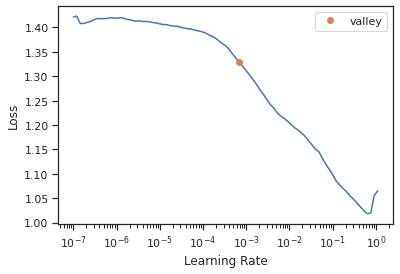

SuggestedLRs(valley=0.0006918309954926372)
lr_find is :SuggestedLRs(valley=0.0006918309954926372), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.342893,0.989069,0.112101,0.088815,00:00
1,1.214929,0.982576,0.132675,0.095686,00:00
2,1.101637,0.994140,0.147073,0.086464,00:01
3,1.013189,1.217397,0.077438,0.098967,00:00
4,0.934130,1.089270,0.197573,0.211082,00:00
5,0.855380,0.719741,0.530217,0.453289,00:00
6,0.786053,0.653283,0.600214,0.559213,00:00
7,0.719782,0.556500,0.683703,0.602230,00:00
8,0.658453,0.525192,0.704662,0.601805,00:00
9,0.603375,0.496799,0.725477,0.644687,00:00


Better model found at epoch 0 with valid_loss value: 0.9890690445899963.
Better model found at epoch 1 with valid_loss value: 0.9825759530067444.
Better model found at epoch 5 with valid_loss value: 0.7197413444519043.
Better model found at epoch 6 with valid_loss value: 0.6532831192016602.
Better model found at epoch 7 with valid_loss value: 0.5565000772476196.
Better model found at epoch 8 with valid_loss value: 0.525191605091095.
Better model found at epoch 9 with valid_loss value: 0.4967992305755615.
Better model found at epoch 10 with valid_loss value: 0.4927847385406494.
Better model found at epoch 11 with valid_loss value: 0.4467466175556183.
Better model found at epoch 12 with valid_loss value: 0.42906737327575684.
Better model found at epoch 14 with valid_loss value: 0.40160444378852844.
Better model found at epoch 15 with valid_loss value: 0.3936934769153595.
Better model found at epoch 16 with valid_loss value: 0.3934480845928192.
Better model found at epoch 17 with valid_lo

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3702
Spearman correlation coefficient: 0.7261
Pearson correlation coefficient: 0.7958 
average spearman for each row is 0.691770926077545
average pearson for each row is 0.7770491972663981
------fold3------


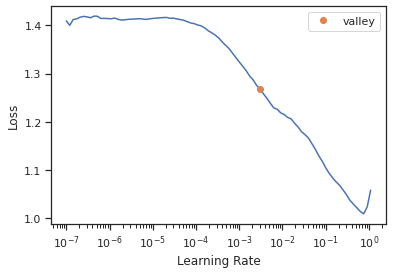

SuggestedLRs(valley=0.0030199517495930195)
lr_find is :SuggestedLRs(valley=0.0030199517495930195), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.355495,0.998770,0.047277,0.036244,00:00
1,1.247295,0.981932,0.134786,0.114988,00:00
2,1.123852,1.004812,0.143383,0.103290,00:00
3,1.031060,1.020884,0.207772,0.156369,00:00
4,0.945616,0.907881,0.370357,0.251619,00:00
5,0.870664,0.804032,0.444262,0.372494,00:00
6,0.802046,0.583511,0.647988,0.572270,00:00
7,0.733471,0.540895,0.681545,0.582486,00:00
8,0.669557,0.488527,0.734726,0.635935,00:00
9,0.608684,0.496403,0.737135,0.656159,00:00


Better model found at epoch 0 with valid_loss value: 0.9987701177597046.
Better model found at epoch 1 with valid_loss value: 0.9819324016571045.
Better model found at epoch 4 with valid_loss value: 0.907881498336792.
Better model found at epoch 5 with valid_loss value: 0.8040317893028259.
Better model found at epoch 6 with valid_loss value: 0.5835111141204834.
Better model found at epoch 7 with valid_loss value: 0.5408945083618164.
Better model found at epoch 8 with valid_loss value: 0.4885269105434418.
Better model found at epoch 10 with valid_loss value: 0.43721917271614075.
Better model found at epoch 12 with valid_loss value: 0.39954468607902527.
Better model found at epoch 14 with valid_loss value: 0.3912731409072876.
Better model found at epoch 17 with valid_loss value: 0.388651579618454.
Better model found at epoch 19 with valid_loss value: 0.38790231943130493.
Better model found at epoch 20 with valid_loss value: 0.3859182298183441.
Better model found at epoch 21 with valid_lo

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3730
Spearman correlation coefficient: 0.7185
Pearson correlation coefficient: 0.7940 
average spearman for each row is 0.6808218586324722
average pearson for each row is 0.7825087138866024
------fold4------


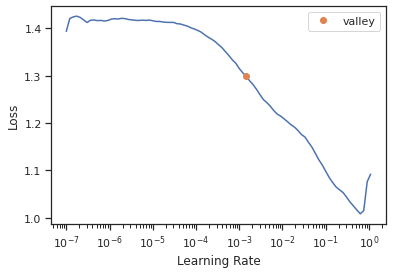

SuggestedLRs(valley=0.0014454397605732083)
lr_find is :SuggestedLRs(valley=0.0014454397605732083), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.345145,0.989255,0.110845,0.113765,00:00
1,1.227661,0.980857,0.138690,0.097960,00:00
2,1.119114,0.989027,0.156368,0.143443,00:00
3,1.021299,1.192259,0.145369,0.129324,00:00
4,0.947773,0.834040,0.410296,0.313454,00:00
5,0.877063,0.773562,0.476623,0.372514,00:00
6,0.804686,0.623916,0.618658,0.535942,00:00
7,0.736668,0.543819,0.690905,0.594083,00:00
8,0.673449,0.528099,0.710290,0.612926,00:00
9,0.613503,0.517623,0.724424,0.627960,00:00


Better model found at epoch 0 with valid_loss value: 0.9892546534538269.
Better model found at epoch 1 with valid_loss value: 0.9808574318885803.
Better model found at epoch 4 with valid_loss value: 0.834040105342865.
Better model found at epoch 5 with valid_loss value: 0.7735618352890015.
Better model found at epoch 6 with valid_loss value: 0.6239156126976013.
Better model found at epoch 7 with valid_loss value: 0.5438191294670105.
Better model found at epoch 8 with valid_loss value: 0.5280991196632385.
Better model found at epoch 9 with valid_loss value: 0.5176231265068054.
Better model found at epoch 10 with valid_loss value: 0.4776363968849182.
Better model found at epoch 11 with valid_loss value: 0.4407128691673279.
Better model found at epoch 13 with valid_loss value: 0.4201406240463257.
Better model found at epoch 14 with valid_loss value: 0.41833505034446716.
Better model found at epoch 15 with valid_loss value: 0.4050270617008209.
Better model found at epoch 16 with valid_loss

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3775
Spearman correlation coefficient: 0.7114
Pearson correlation coefficient: 0.7907 
average spearman for each row is 0.6846613717324208
average pearson for each row is 0.7663435761477505
---------- score of OOF ----------------
average spearman for each row is 0.6871705840330679
average pearson for each row is 0.7728542111594943


In [ ]:
oof_mlp, cor_mlp = train_dl_cv(t5,
                               t5_col,
                               target_col, 
                               splits, 
                               cnn_t5, 
                               save = 'cnn_t5',
                               params = params)

0.7728542111594943


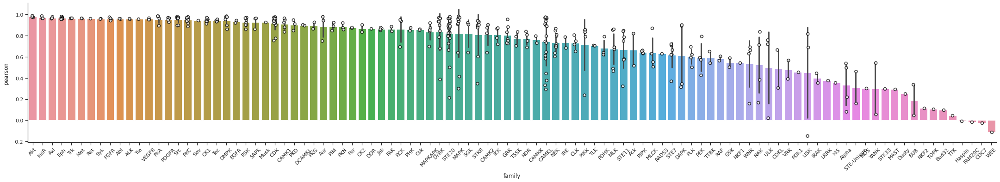

In [ ]:
get_report(cor_mlp)

In [ ]:
oof_mlp.index = info.kinase

In [ ]:
oof_results['cnn_t5'] = oof_mlp

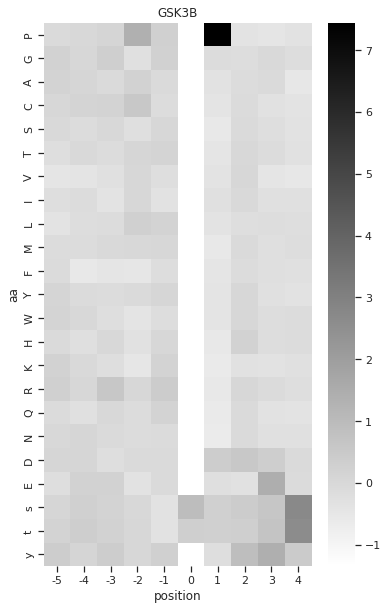

In [ ]:
get_heatmap2(oof_mlp,'GSK3B')

------fold0------


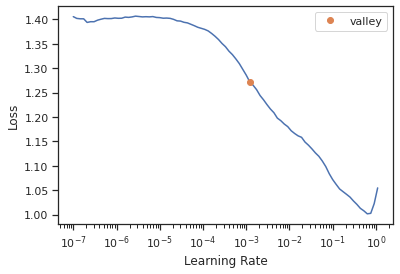

SuggestedLRs(valley=0.0012022644514217973)
lr_find is :SuggestedLRs(valley=0.0012022644514217973), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.305078,0.989648,0.112117,0.064877,00:00
1,1.170354,1.002651,0.077530,-0.013790,00:00
2,1.065348,1.021360,0.127695,0.115013,00:00
3,0.975334,1.097803,0.160117,0.122926,00:00
4,0.904377,0.846418,0.391988,0.356244,00:00
5,0.845744,0.745210,0.513296,0.455201,00:00
6,0.786170,0.577074,0.655658,0.567630,00:00
7,0.724190,0.495686,0.719120,0.660167,00:00
8,0.662903,0.489543,0.727535,0.652130,00:00
9,0.604734,0.444181,0.755845,0.676777,00:00


Better model found at epoch 0 with valid_loss value: 0.9896479845046997.
Better model found at epoch 4 with valid_loss value: 0.8464183211326599.
Better model found at epoch 5 with valid_loss value: 0.7452103495597839.
Better model found at epoch 6 with valid_loss value: 0.5770738124847412.
Better model found at epoch 7 with valid_loss value: 0.495686411857605.
Better model found at epoch 8 with valid_loss value: 0.4895428419113159.
Better model found at epoch 9 with valid_loss value: 0.44418105483055115.
Better model found at epoch 10 with valid_loss value: 0.43404045701026917.
Better model found at epoch 12 with valid_loss value: 0.4046441316604614.
Better model found at epoch 14 with valid_loss value: 0.39793282747268677.
Better model found at epoch 15 with valid_loss value: 0.38198158144950867.
Better model found at epoch 16 with valid_loss value: 0.373122900724411.
Better model found at epoch 19 with valid_loss value: 0.3635358214378357.
Better model found at epoch 23 with valid_l

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3548
Spearman correlation coefficient: 0.7485
Pearson correlation coefficient: 0.8101 
average spearman for each row is 0.7185705173078336
average pearson for each row is 0.7909831960090373
------fold1------


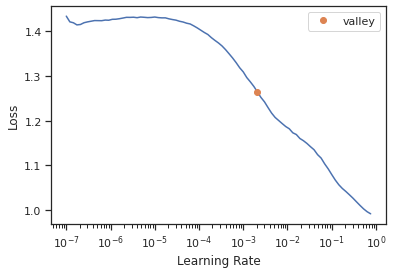

SuggestedLRs(valley=0.0020892962347716093)
lr_find is :SuggestedLRs(valley=0.0020892962347716093), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.331098,0.996750,0.058647,0.034842,00:00
1,1.199083,1.002439,0.063636,0.016029,00:00
2,1.074211,1.003878,0.127487,0.134956,00:00
3,0.974403,0.988978,0.214513,0.140318,00:00
4,0.896271,0.922731,0.298271,0.276474,00:00
5,0.834529,0.800783,0.454398,0.370594,00:00
6,0.770915,0.623513,0.624098,0.541198,00:01
7,0.709921,0.534317,0.682894,0.610025,00:01
8,0.654309,0.477237,0.728438,0.643054,00:00
9,0.604917,0.497459,0.720024,0.629535,00:00


Better model found at epoch 0 with valid_loss value: 0.9967498779296875.
Better model found at epoch 3 with valid_loss value: 0.9889784455299377.
Better model found at epoch 4 with valid_loss value: 0.9227307438850403.
Better model found at epoch 5 with valid_loss value: 0.8007833361625671.
Better model found at epoch 6 with valid_loss value: 0.6235129237174988.
Better model found at epoch 7 with valid_loss value: 0.534316897392273.
Better model found at epoch 8 with valid_loss value: 0.4772372245788574.
Better model found at epoch 10 with valid_loss value: 0.4563805162906647.
Better model found at epoch 12 with valid_loss value: 0.4111659824848175.
Better model found at epoch 14 with valid_loss value: 0.4098200798034668.
Better model found at epoch 15 with valid_loss value: 0.38578611612319946.
Better model found at epoch 16 with valid_loss value: 0.3827129900455475.
Better model found at epoch 18 with valid_loss value: 0.37851482629776.
Better model found at epoch 19 with valid_loss 

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3627
Spearman correlation coefficient: 0.7387
Pearson correlation coefficient: 0.8047 
average spearman for each row is 0.7083650889075574
average pearson for each row is 0.7936718628699959
------fold2------


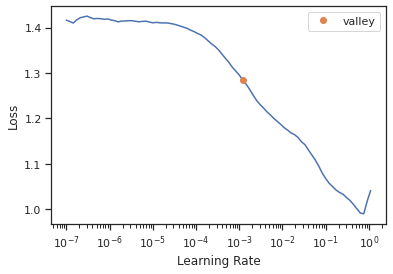

SuggestedLRs(valley=0.0012022644514217973)
lr_find is :SuggestedLRs(valley=0.0012022644514217973), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.313097,0.991734,0.096229,0.048940,00:00
1,1.177641,0.989795,0.107680,0.055653,00:01
2,1.064549,1.011118,0.114980,0.110956,00:00
3,0.975828,0.986116,0.201476,0.164721,00:00
4,0.905480,1.024466,0.247604,0.159549,00:00
5,0.840762,0.823875,0.422331,0.416238,00:00
6,0.783541,0.592838,0.638474,0.576132,00:00
7,0.723690,0.508608,0.701263,0.605624,00:00
8,0.667376,0.451612,0.751619,0.666721,00:00
9,0.613532,0.475534,0.746551,0.666034,00:01


Better model found at epoch 0 with valid_loss value: 0.9917335510253906.
Better model found at epoch 1 with valid_loss value: 0.9897950291633606.
Better model found at epoch 3 with valid_loss value: 0.9861156940460205.
Better model found at epoch 5 with valid_loss value: 0.8238746523857117.
Better model found at epoch 6 with valid_loss value: 0.5928377509117126.
Better model found at epoch 7 with valid_loss value: 0.5086076259613037.
Better model found at epoch 8 with valid_loss value: 0.45161154866218567.
Better model found at epoch 10 with valid_loss value: 0.41317877173423767.
Better model found at epoch 11 with valid_loss value: 0.40916305780410767.
Better model found at epoch 12 with valid_loss value: 0.39731329679489136.
Better model found at epoch 13 with valid_loss value: 0.38510531187057495.
Better model found at epoch 14 with valid_loss value: 0.36569786071777344.
Better model found at epoch 17 with valid_loss value: 0.35102319717407227.
Better model found at epoch 18 with va

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3361
Spearman correlation coefficient: 0.7515
Pearson correlation coefficient: 0.8216 
average spearman for each row is 0.7286329979416867
average pearson for each row is 0.8129791327002683
------fold3------


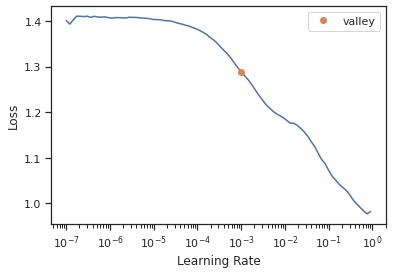

SuggestedLRs(valley=0.0010000000474974513)
lr_find is :SuggestedLRs(valley=0.0010000000474974513), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.312322,0.990358,0.103701,0.062522,00:01
1,1.183396,0.986622,0.117028,0.048674,00:00
2,1.074270,1.022934,0.119589,0.120012,00:00
3,0.984843,1.277705,0.117636,0.131867,00:00
4,0.917988,0.880217,0.348301,0.282962,00:01
5,0.851700,0.777008,0.475715,0.407068,00:00
6,0.791755,0.567497,0.660053,0.525922,00:00
7,0.734747,0.483688,0.718821,0.607195,00:00
8,0.680436,0.455558,0.745684,0.640291,00:00
9,0.625321,0.420890,0.769071,0.678277,00:00


Better model found at epoch 0 with valid_loss value: 0.990357518196106.
Better model found at epoch 1 with valid_loss value: 0.9866224527359009.
Better model found at epoch 4 with valid_loss value: 0.880216658115387.
Better model found at epoch 5 with valid_loss value: 0.7770081758499146.
Better model found at epoch 6 with valid_loss value: 0.5674974918365479.
Better model found at epoch 7 with valid_loss value: 0.4836876094341278.
Better model found at epoch 8 with valid_loss value: 0.4555583894252777.
Better model found at epoch 9 with valid_loss value: 0.42088982462882996.
Better model found at epoch 10 with valid_loss value: 0.4037150740623474.
Better model found at epoch 11 with valid_loss value: 0.3858746886253357.
Better model found at epoch 12 with valid_loss value: 0.38340428471565247.
Better model found at epoch 13 with valid_loss value: 0.36014580726623535.
Better model found at epoch 14 with valid_loss value: 0.3560173213481903.
Better model found at epoch 15 with valid_los

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3151
Spearman correlation coefficient: 0.7459
Pearson correlation coefficient: 0.8304 
average spearman for each row is 0.7142084665767708
average pearson for each row is 0.8199714556165226
------fold4------


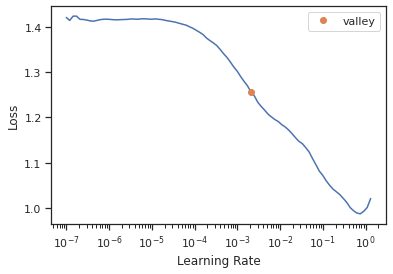

SuggestedLRs(valley=0.0020892962347716093)
lr_find is :SuggestedLRs(valley=0.0020892962347716093), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.316377,0.995316,0.068617,0.074197,00:00
1,1.192911,0.990298,0.101942,0.072972,00:01
2,1.077741,1.013927,0.142891,0.103046,00:00
3,0.982249,0.929723,0.278668,0.210954,00:00
4,0.909476,0.834983,0.408497,0.367956,00:00
5,0.849274,0.736725,0.517847,0.451830,00:01
6,0.788365,0.644929,0.596780,0.545333,00:00
7,0.725425,0.493873,0.716193,0.628399,00:00
8,0.667271,0.470778,0.739228,0.648308,00:00
9,0.611327,0.440292,0.762330,0.672577,00:00


Better model found at epoch 0 with valid_loss value: 0.9953160285949707.
Better model found at epoch 1 with valid_loss value: 0.9902978539466858.
Better model found at epoch 3 with valid_loss value: 0.9297230839729309.
Better model found at epoch 4 with valid_loss value: 0.8349829316139221.
Better model found at epoch 5 with valid_loss value: 0.7367246747016907.
Better model found at epoch 6 with valid_loss value: 0.6449288725852966.
Better model found at epoch 7 with valid_loss value: 0.49387305974960327.
Better model found at epoch 8 with valid_loss value: 0.47077783942222595.
Better model found at epoch 9 with valid_loss value: 0.44029173254966736.
Better model found at epoch 11 with valid_loss value: 0.4130144715309143.
Better model found at epoch 12 with valid_loss value: 0.39165958762168884.
Better model found at epoch 13 with valid_loss value: 0.3860248029232025.
Better model found at epoch 14 with valid_loss value: 0.38431888818740845.
Better model found at epoch 15 with valid_

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3407
Spearman correlation coefficient: 0.7517
Pearson correlation coefficient: 0.8186 
average spearman for each row is 0.7260573632441273
average pearson for each row is 0.8007604338666743
---------- score of OOF ----------------
average spearman for each row is 0.7191668867955953
average pearson for each row is 0.8036732162124997


In [ ]:
oof_mlp, cor_mlp = train_dl_cv(t5_kd,
                               t5_col,
                               target_col, 
                               splits, 
                               cnn_t5, 
                               save = 'cnn_t5_kd',
                               params = params)

0.8036732162124997


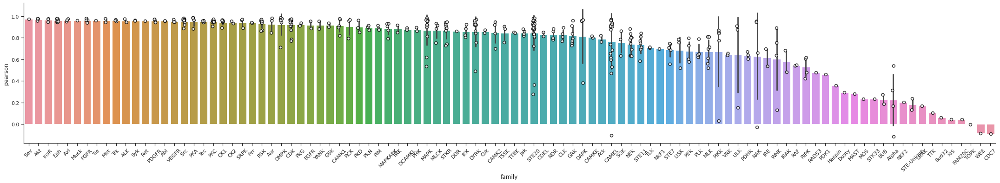

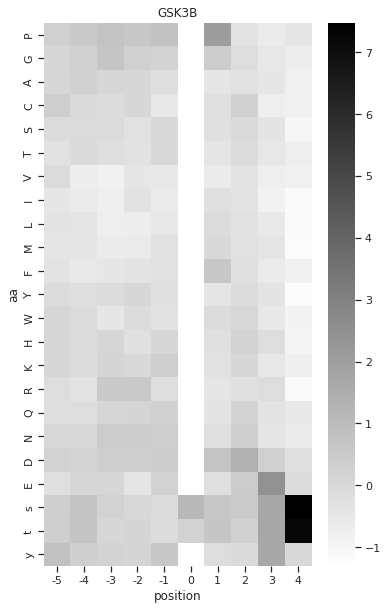

In [ ]:
get_report(cor_mlp)
oof_mlp.index = info.kinase
get_heatmap2(oof_mlp,'GSK3B')

oof_results['cnn_t5_kd'] = oof_mlp

In [ ]:
def cnn_esm():
    return CNN1D_2(num_esm, num_target)

------fold0------


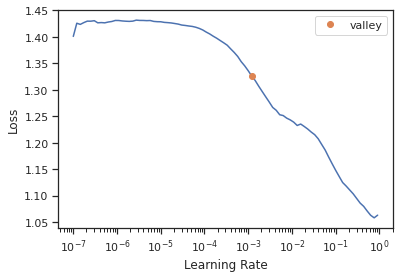

SuggestedLRs(valley=0.0012022644514217973)
lr_find is :SuggestedLRs(valley=0.0012022644514217973), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.362680,0.987480,0.124242,0.117270,00:00
1,1.238508,0.983701,0.127952,0.109630,00:00
2,1.129927,0.960859,0.198620,0.144129,00:00
3,1.052058,0.934911,0.278178,0.207422,00:00
4,0.981398,0.822202,0.422106,0.347639,00:00
5,0.928707,0.756225,0.531588,0.450299,00:01
6,0.870615,0.672554,0.608192,0.539439,00:00
7,0.804742,0.642163,0.661729,0.577535,00:00
8,0.741327,0.560445,0.677460,0.599217,00:00
9,0.681801,0.511703,0.709989,0.625825,00:00


Better model found at epoch 0 with valid_loss value: 0.9874798655509949.
Better model found at epoch 1 with valid_loss value: 0.983700692653656.
Better model found at epoch 2 with valid_loss value: 0.9608594179153442.
Better model found at epoch 3 with valid_loss value: 0.9349110126495361.
Better model found at epoch 4 with valid_loss value: 0.8222018480300903.
Better model found at epoch 5 with valid_loss value: 0.7562252879142761.
Better model found at epoch 6 with valid_loss value: 0.6725538969039917.
Better model found at epoch 7 with valid_loss value: 0.6421632766723633.
Better model found at epoch 8 with valid_loss value: 0.5604454278945923.
Better model found at epoch 9 with valid_loss value: 0.5117027163505554.
Better model found at epoch 10 with valid_loss value: 0.46971434354782104.
Better model found at epoch 12 with valid_loss value: 0.4525226056575775.
Better model found at epoch 13 with valid_loss value: 0.4279141128063202.
Better model found at epoch 15 with valid_loss v

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3816
Spearman correlation coefficient: 0.7183
Pearson correlation coefficient: 0.7882 
average spearman for each row is 0.6757391472731571
average pearson for each row is 0.7637387704047276
------fold1------


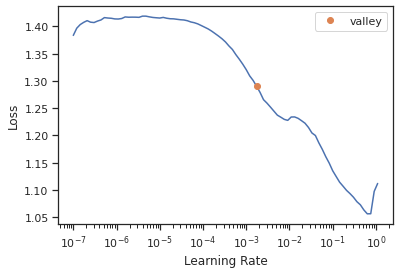

SuggestedLRs(valley=0.001737800776027143)
lr_find is :SuggestedLRs(valley=0.001737800776027143), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.352088,0.995434,0.067756,0.069685,00:00
1,1.229620,0.985548,0.120450,0.116846,00:00
2,1.126749,0.967736,0.193171,0.163032,00:00
3,1.049729,0.916884,0.299202,0.248251,00:00
4,0.983757,0.921723,0.368443,0.338354,00:00
5,0.920146,0.728267,0.526520,0.454510,00:00
6,0.852270,0.653144,0.607007,0.545597,00:00
7,0.782317,0.601073,0.655612,0.585251,00:00
8,0.718068,0.582420,0.671402,0.599682,00:00
9,0.658796,0.560130,0.685809,0.624853,00:00


Better model found at epoch 0 with valid_loss value: 0.9954336285591125.
Better model found at epoch 1 with valid_loss value: 0.9855479598045349.
Better model found at epoch 2 with valid_loss value: 0.9677363634109497.
Better model found at epoch 3 with valid_loss value: 0.9168835878372192.
Better model found at epoch 5 with valid_loss value: 0.7282673716545105.
Better model found at epoch 6 with valid_loss value: 0.6531437039375305.
Better model found at epoch 7 with valid_loss value: 0.6010728478431702.
Better model found at epoch 8 with valid_loss value: 0.5824198722839355.
Better model found at epoch 9 with valid_loss value: 0.5601304769515991.
Better model found at epoch 10 with valid_loss value: 0.5383880138397217.
Better model found at epoch 11 with valid_loss value: 0.5016034245491028.
Better model found at epoch 13 with valid_loss value: 0.4646073281764984.
Better model found at epoch 15 with valid_loss value: 0.46258851885795593.
Better model found at epoch 16 with valid_loss

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.4134
Spearman correlation coefficient: 0.7112
Pearson correlation coefficient: 0.7695 
average spearman for each row is 0.6778708069075241
average pearson for each row is 0.751896826252072
------fold2------


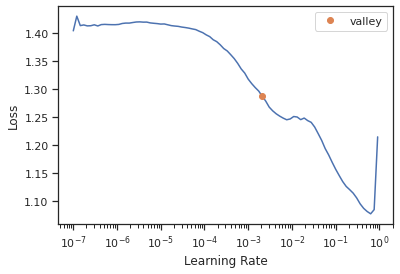

SuggestedLRs(valley=0.0020892962347716093)
lr_find is :SuggestedLRs(valley=0.0020892962347716093), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.350624,0.995439,0.067656,0.059789,00:00
1,1.227610,0.994884,0.075255,0.068480,00:00
2,1.122289,0.985031,0.148158,0.124375,00:00
3,1.043393,1.033986,0.218590,0.201214,00:00
4,0.979433,0.804161,0.442792,0.390580,00:00
5,0.921088,0.845817,0.437461,0.399329,00:00
6,0.858593,0.622523,0.619573,0.534665,00:00
7,0.796960,0.617635,0.651268,0.561027,00:00
8,0.739736,0.541644,0.697678,0.614868,00:00
9,0.677929,0.490866,0.728148,0.648122,00:00


Better model found at epoch 0 with valid_loss value: 0.9954389929771423.
Better model found at epoch 1 with valid_loss value: 0.9948835372924805.
Better model found at epoch 2 with valid_loss value: 0.9850306510925293.
Better model found at epoch 4 with valid_loss value: 0.8041610717773438.
Better model found at epoch 6 with valid_loss value: 0.6225234866142273.
Better model found at epoch 7 with valid_loss value: 0.6176351308822632.
Better model found at epoch 8 with valid_loss value: 0.5416440963745117.
Better model found at epoch 9 with valid_loss value: 0.490866094827652.
Better model found at epoch 12 with valid_loss value: 0.4436134397983551.
Better model found at epoch 14 with valid_loss value: 0.4235371947288513.
Better model found at epoch 16 with valid_loss value: 0.4006483256816864.
Better model found at epoch 18 with valid_loss value: 0.39437058568000793.
Better model found at epoch 19 with valid_loss value: 0.38883665204048157.
Better model found at epoch 20 with valid_los

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3826
Spearman correlation coefficient: 0.7160
Pearson correlation coefficient: 0.7894 
average spearman for each row is 0.6898452223339101
average pearson for each row is 0.7708439606807652
------fold3------


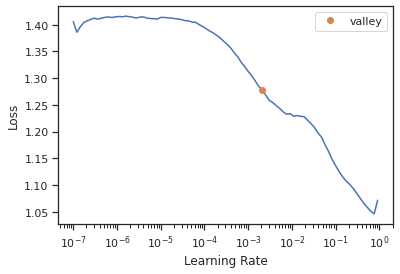

SuggestedLRs(valley=0.0020892962347716093)
lr_find is :SuggestedLRs(valley=0.0020892962347716093), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.335412,0.996071,0.062919,0.038647,00:00
1,1.215690,0.984445,0.125846,0.092136,00:01
2,1.111763,0.971595,0.184522,0.171846,00:00
3,1.037685,0.900640,0.334293,0.253211,00:00
4,0.973862,0.837972,0.411707,0.378199,00:00
5,0.909528,0.735635,0.531433,0.471828,00:00
6,0.849948,0.646582,0.633767,0.550431,00:00
7,0.787250,0.664157,0.625433,0.545810,00:00
8,0.729574,0.598965,0.665859,0.602218,00:00
9,0.675383,0.545216,0.688174,0.594875,00:00


Better model found at epoch 0 with valid_loss value: 0.9960708618164062.
Better model found at epoch 1 with valid_loss value: 0.9844451546669006.
Better model found at epoch 2 with valid_loss value: 0.9715945720672607.
Better model found at epoch 3 with valid_loss value: 0.9006399512290955.
Better model found at epoch 4 with valid_loss value: 0.8379718065261841.
Better model found at epoch 5 with valid_loss value: 0.7356346249580383.
Better model found at epoch 6 with valid_loss value: 0.6465824246406555.
Better model found at epoch 8 with valid_loss value: 0.5989651083946228.
Better model found at epoch 9 with valid_loss value: 0.5452160835266113.
Better model found at epoch 10 with valid_loss value: 0.49941110610961914.
Better model found at epoch 12 with valid_loss value: 0.4533989727497101.
Better model found at epoch 13 with valid_loss value: 0.44593146443367004.
Better model found at epoch 15 with valid_loss value: 0.4414266347885132.
Better model found at epoch 16 with valid_los

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3915
Spearman correlation coefficient: 0.7002
Pearson correlation coefficient: 0.7816 
average spearman for each row is 0.6572510834090314
average pearson for each row is 0.7615019402853355
------fold4------


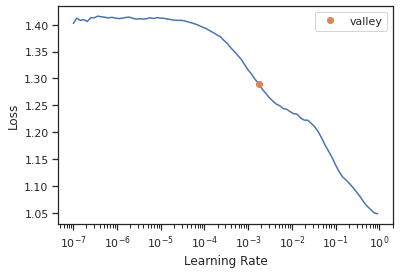

SuggestedLRs(valley=0.001737800776027143)
lr_find is :SuggestedLRs(valley=0.001737800776027143), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.352947,0.996905,0.056393,0.020091,00:00
1,1.236797,0.992118,0.091211,0.045565,00:00
2,1.135033,0.953529,0.219430,0.192124,00:00
3,1.057354,0.989710,0.276150,0.137335,00:01
4,1.000098,0.899409,0.378984,0.270234,00:00
5,0.948612,0.673000,0.573356,0.437489,00:00
6,0.884599,0.609844,0.635468,0.541492,00:01
7,0.815139,0.608621,0.669370,0.576765,00:00
8,0.749037,0.523295,0.709612,0.614077,00:00
9,0.684747,0.503786,0.717171,0.624954,00:00


Better model found at epoch 0 with valid_loss value: 0.9969053864479065.
Better model found at epoch 1 with valid_loss value: 0.9921180605888367.
Better model found at epoch 2 with valid_loss value: 0.9535285830497742.
Better model found at epoch 4 with valid_loss value: 0.8994093537330627.
Better model found at epoch 5 with valid_loss value: 0.672999918460846.
Better model found at epoch 6 with valid_loss value: 0.6098440885543823.
Better model found at epoch 7 with valid_loss value: 0.6086206436157227.
Better model found at epoch 8 with valid_loss value: 0.5232948064804077.
Better model found at epoch 9 with valid_loss value: 0.5037863254547119.
Better model found at epoch 10 with valid_loss value: 0.48976486921310425.
Better model found at epoch 11 with valid_loss value: 0.48315587639808655.
Better model found at epoch 12 with valid_loss value: 0.4386056363582611.
Better model found at epoch 14 with valid_loss value: 0.41184601187705994.
Better model found at epoch 16 with valid_los

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3814
Spearman correlation coefficient: 0.6989
Pearson correlation coefficient: 0.7873 
average spearman for each row is 0.6733676047466585
average pearson for each row is 0.7659298837450216
---------- score of OOF ----------------
average spearman for each row is 0.6748147729340562
average pearson for each row is 0.7627822762735844


In [ ]:
oof_mlp, cor_mlp = train_dl_cv(esm,
                               esm_col,
                               target_col, 
                               splits, 
                               cnn_esm, 
                               save = 'cnn_esm',
                               params = params)

0.7627822762735844


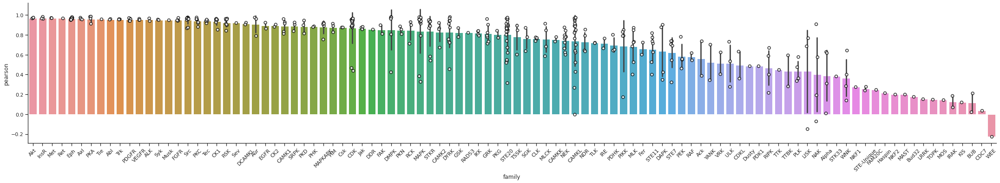

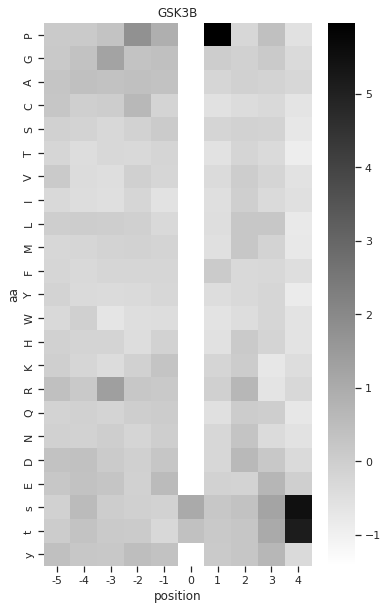

In [ ]:
get_report(cor_mlp)
oof_mlp.index = info.kinase
get_heatmap2(oof_mlp,'GSK3B')

oof_results['cnn_esm'] = oof_mlp

------fold0------


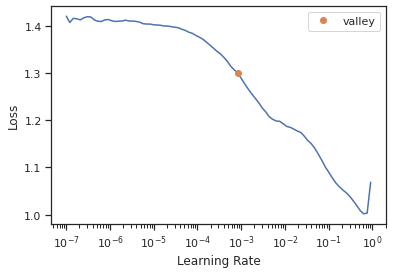

SuggestedLRs(valley=0.0008317637839354575)
lr_find is :SuggestedLRs(valley=0.0008317637839354575), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.316949,0.989343,0.112299,0.050157,00:00
1,1.176143,0.981932,0.135132,0.079152,00:00
2,1.069863,0.953093,0.221185,0.172151,00:00
3,0.987091,0.916174,0.319267,0.236431,00:00
4,0.921721,0.796241,0.474437,0.422170,00:00
5,0.858270,0.623672,0.615101,0.540635,00:00
6,0.798505,0.589530,0.661301,0.568914,00:00
7,0.739071,0.548536,0.697210,0.598803,00:00
8,0.681803,0.529657,0.714427,0.638200,00:00
9,0.629133,0.531945,0.722027,0.642399,00:00


Better model found at epoch 0 with valid_loss value: 0.9893431067466736.
Better model found at epoch 1 with valid_loss value: 0.9819321036338806.
Better model found at epoch 2 with valid_loss value: 0.9530925154685974.
Better model found at epoch 3 with valid_loss value: 0.9161744713783264.
Better model found at epoch 4 with valid_loss value: 0.7962408065795898.
Better model found at epoch 5 with valid_loss value: 0.6236720085144043.
Better model found at epoch 6 with valid_loss value: 0.5895300507545471.
Better model found at epoch 7 with valid_loss value: 0.5485361814498901.
Better model found at epoch 8 with valid_loss value: 0.5296567678451538.
Better model found at epoch 10 with valid_loss value: 0.4745868146419525.
Better model found at epoch 12 with valid_loss value: 0.42510056495666504.
Better model found at epoch 14 with valid_loss value: 0.39569029211997986.
Better model found at epoch 15 with valid_loss value: 0.39153632521629333.
Better model found at epoch 17 with valid_lo

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3531
Spearman correlation coefficient: 0.7395
Pearson correlation coefficient: 0.8069 
average spearman for each row is 0.7079461117500481
average pearson for each row is 0.7843162796095668
------fold1------


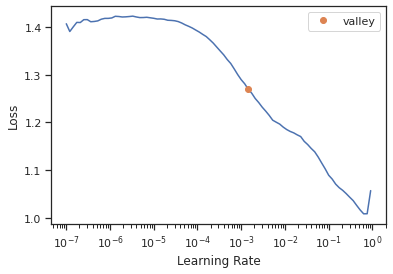

SuggestedLRs(valley=0.0014454397605732083)
lr_find is :SuggestedLRs(valley=0.0014454397605732083), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.311211,1.000519,0.027311,0.011923,00:00
1,1.168785,0.989627,0.104336,0.054198,00:00
2,1.061152,0.936576,0.255054,0.182928,00:00
3,0.982151,0.900342,0.326080,0.230117,00:00
4,0.917109,0.741812,0.510544,0.394338,00:00
5,0.858996,0.638095,0.605757,0.515651,00:00
6,0.798383,0.608564,0.649718,0.578864,00:00
7,0.736489,0.535571,0.699588,0.625854,00:01
8,0.680954,0.519507,0.713027,0.644947,00:00
9,0.626448,0.555692,0.706795,0.652341,00:00


Better model found at epoch 0 with valid_loss value: 1.000518560409546.
Better model found at epoch 1 with valid_loss value: 0.9896273612976074.
Better model found at epoch 2 with valid_loss value: 0.9365758895874023.
Better model found at epoch 3 with valid_loss value: 0.9003415107727051.
Better model found at epoch 4 with valid_loss value: 0.7418117523193359.
Better model found at epoch 5 with valid_loss value: 0.6380952000617981.
Better model found at epoch 6 with valid_loss value: 0.6085639595985413.
Better model found at epoch 7 with valid_loss value: 0.5355710983276367.
Better model found at epoch 8 with valid_loss value: 0.5195068717002869.
Better model found at epoch 10 with valid_loss value: 0.4552890658378601.
Better model found at epoch 12 with valid_loss value: 0.4214746057987213.
Better model found at epoch 14 with valid_loss value: 0.4026680588722229.
Better model found at epoch 17 with valid_loss value: 0.38269880414009094.
Better model found at epoch 20 with valid_loss 

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3726
Spearman correlation coefficient: 0.7380
Pearson correlation coefficient: 0.7971 
average spearman for each row is 0.7050310787076131
average pearson for each row is 0.7853449987634417
------fold2------


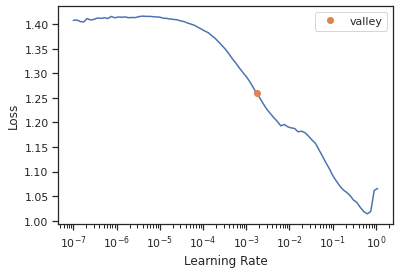

SuggestedLRs(valley=0.001737800776027143)
lr_find is :SuggestedLRs(valley=0.001737800776027143), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.298969,0.999608,0.039582,-0.008259,00:00
1,1.161338,1.011351,0.041479,-0.001069,00:01
2,1.059625,0.979784,0.183510,0.161778,00:00
3,0.980713,0.842230,0.398032,0.307105,00:00
4,0.914279,0.716168,0.533109,0.479889,00:00
5,0.854191,0.649770,0.608254,0.544079,00:00
6,0.792756,0.594502,0.667028,0.589129,00:00
7,0.736528,0.556101,0.700070,0.634623,00:00
8,0.677844,0.509675,0.731128,0.665054,00:00
9,0.624002,0.475527,0.746788,0.668456,00:00


Better model found at epoch 0 with valid_loss value: 0.9996083378791809.
Better model found at epoch 2 with valid_loss value: 0.9797838926315308.
Better model found at epoch 3 with valid_loss value: 0.842230498790741.
Better model found at epoch 4 with valid_loss value: 0.7161679267883301.
Better model found at epoch 5 with valid_loss value: 0.6497704982757568.
Better model found at epoch 6 with valid_loss value: 0.5945024490356445.
Better model found at epoch 7 with valid_loss value: 0.5561013221740723.
Better model found at epoch 8 with valid_loss value: 0.509675145149231.
Better model found at epoch 9 with valid_loss value: 0.4755268692970276.
Better model found at epoch 10 with valid_loss value: 0.4493982493877411.
Better model found at epoch 11 with valid_loss value: 0.4279981255531311.
Better model found at epoch 12 with valid_loss value: 0.3987039625644684.
Better model found at epoch 13 with valid_loss value: 0.388874351978302.
Better model found at epoch 14 with valid_loss val

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3415
Spearman correlation coefficient: 0.7543
Pearson correlation coefficient: 0.8170 
average spearman for each row is 0.7290649173095708
average pearson for each row is 0.8051109611942535
------fold3------


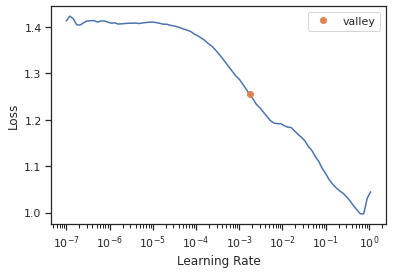

SuggestedLRs(valley=0.001737800776027143)
lr_find is :SuggestedLRs(valley=0.001737800776027143), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.301000,0.999691,0.035720,-0.001009,00:00
1,1.170855,0.988394,0.111806,0.088316,00:00
2,1.072063,0.923454,0.278165,0.237588,00:00
3,0.988908,0.878179,0.362015,0.244263,00:00
4,0.927350,0.704996,0.545616,0.445111,00:00
5,0.868883,0.612672,0.624692,0.536800,00:00
6,0.809572,0.608047,0.653123,0.551475,00:00
7,0.746393,0.543405,0.702368,0.624358,00:00
8,0.690641,0.482542,0.741637,0.646029,00:00
9,0.635535,0.464627,0.748452,0.648026,00:00


Better model found at epoch 0 with valid_loss value: 0.9996911287307739.
Better model found at epoch 1 with valid_loss value: 0.9883943200111389.
Better model found at epoch 2 with valid_loss value: 0.9234538674354553.
Better model found at epoch 3 with valid_loss value: 0.878179132938385.
Better model found at epoch 4 with valid_loss value: 0.7049962282180786.
Better model found at epoch 5 with valid_loss value: 0.6126716732978821.
Better model found at epoch 6 with valid_loss value: 0.6080470681190491.
Better model found at epoch 7 with valid_loss value: 0.5434048175811768.
Better model found at epoch 8 with valid_loss value: 0.4825415015220642.
Better model found at epoch 9 with valid_loss value: 0.46462729573249817.
Better model found at epoch 11 with valid_loss value: 0.3978430926799774.
Better model found at epoch 12 with valid_loss value: 0.3908361792564392.
Better model found at epoch 13 with valid_loss value: 0.38233086466789246.
Better model found at epoch 15 with valid_loss 

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3224
Spearman correlation coefficient: 0.7427
Pearson correlation coefficient: 0.8259 
average spearman for each row is 0.7074565360268383
average pearson for each row is 0.8089937511931363
------fold4------


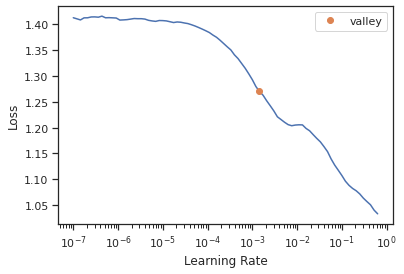

SuggestedLRs(valley=0.0014454397605732083)
lr_find is :SuggestedLRs(valley=0.0014454397605732083), params lr is 0.003


epoch,train_loss,valid_loss,pearsonr,spearmanr,time
0,1.313872,0.995036,0.071004,0.044617,00:01
1,1.171610,0.984243,0.126968,0.048654,00:00
2,1.071821,0.905945,0.320273,0.247383,00:00
3,0.991680,0.789555,0.459834,0.355995,00:01
4,0.924869,0.765091,0.490200,0.362948,00:00
5,0.869261,0.567165,0.658601,0.570008,00:00
6,0.801884,0.521509,0.700481,0.588994,00:01
7,0.738810,0.514451,0.720447,0.617055,00:00
8,0.678636,0.551925,0.719163,0.633686,00:00
9,0.625149,0.497110,0.729960,0.636090,00:01


Better model found at epoch 0 with valid_loss value: 0.995035707950592.
Better model found at epoch 1 with valid_loss value: 0.9842432737350464.
Better model found at epoch 2 with valid_loss value: 0.9059451222419739.
Better model found at epoch 3 with valid_loss value: 0.789555013179779.
Better model found at epoch 4 with valid_loss value: 0.765091061592102.
Better model found at epoch 5 with valid_loss value: 0.5671654939651489.
Better model found at epoch 6 with valid_loss value: 0.5215085744857788.
Better model found at epoch 7 with valid_loss value: 0.514451265335083.
Better model found at epoch 9 with valid_loss value: 0.4971104562282562.
Better model found at epoch 10 with valid_loss value: 0.4479900896549225.
Better model found at epoch 11 with valid_loss value: 0.42004212737083435.
Better model found at epoch 13 with valid_loss value: 0.4167186915874481.
Better model found at epoch 14 with valid_loss value: 0.4065311551094055.
Better model found at epoch 16 with valid_loss val

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


mse is 0.3490
Spearman correlation coefficient: 0.7359
Pearson correlation coefficient: 0.8120 
average spearman for each row is 0.7082996669671181
average pearson for each row is 0.793517370873715
---------- score of OOF ----------------
average spearman for each row is 0.7115596621522376
average pearson for each row is 0.7954566723268228


In [ ]:
oof_mlp, cor_mlp = train_dl_cv(esm_kd,
                               esm_col,
                               target_col, 
                               splits, 
                               cnn_esm, 
                               save = 'cnn_esm_kd',
                               params = params)

0.7954566723268228


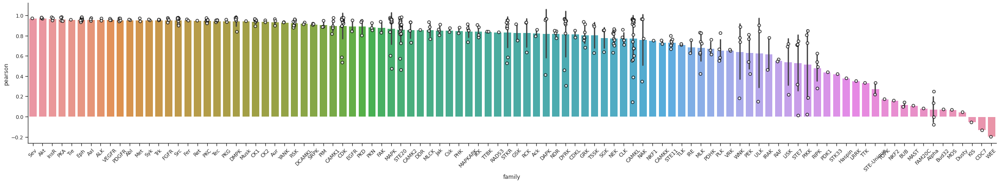

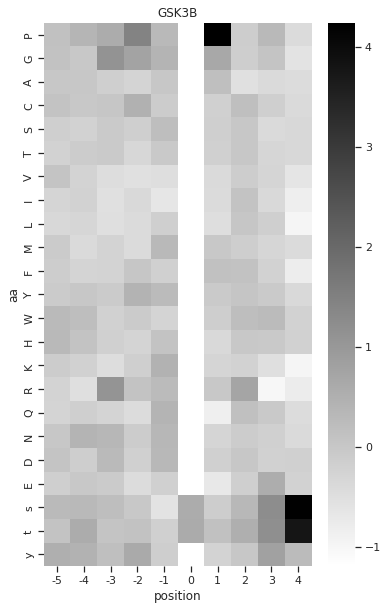

In [ ]:
get_report(cor_mlp)
oof_mlp.index = info.kinase
get_heatmap2(oof_mlp,'GSK3B')
oof_results['cnn_esm_kd'] = oof_mlp

## ML

In [ ]:
models = {
    
    'LinearRegression': LinearRegression(),
    'Lasso': Lasso(0.1), # L1 regularization # changing alpha does not change the result
    'Ridge': Ridge(alpha=0.1), # L2 regularization
    'ElasticNet': ElasticNet(0.1), # Combine L1 and L2
    
    # 'SVR':SVR(C=10,gamma=1),
    'DecisionTreeRegressor': DecisionTreeRegressor(), # not very good
    'KNN': KNeighborsRegressor(n_neighbors=3), # compared with others, n=3 gives the best results
    # 'XGBRegressor': XGBRegressor(), #slow without gpu
    # 'RandomForestRegressor': RandomForestRegressor() # slow, use cuml to use gpu
                                      }

In [ ]:
t5_col

Index(['T5_0', 'T5_1', 'T5_2', 'T5_3', 'T5_4', 'T5_5', 'T5_6', 'T5_7', 'T5_8',
       'T5_9',
       ...
       'T5_1014', 'T5_1015', 'T5_1016', 'T5_1017', 'T5_1018', 'T5_1019',
       'T5_1020', 'T5_1021', 'T5_1022', 'T5_1023'],
      dtype='object', length=1024)

In [ ]:
def train_cv2(df, # dataframe of values
             feat_col, # feature columns
             target_col,  # target columns
             splits, # splits
             model, # sklearn model
             save_name = None, # model name to be saved, e.g., 'LR'
             params = {}
            ):
    OOF = []
    for fold, split in enumerate(splits):
        print(f'------ fold: {fold} --------')
        
        if save_name is not None: 
            target, pred = train_ml(df, feat_col, target_col, split, model, f'models/{save_name}_{fold}.joblib',params)
        else:
            target, pred = train_ml(df, feat_col, target_col, split, model, params=params)

        score_all(target,pred)
        score_each(target,pred)
        OOF.append(pred)
        
    oof_df = pd.concat(OOF).sort_index()
    
    return oof_df

In [ ]:
suffix = 't5'
for k,model in models.items():
    print(f'------------------- start training model {k} ----------------------')
    oof = train_cv2(t5, t5_col, target_col, splits, model)
    
    oof_results[f'{suffix}_{k}'] = oof
    print('----------- oof score is ------------------')
    score_all(y,oof)
    corr = score_each(y,oof)

------------------- start training model LinearRegression ----------------------
------ fold: 0 --------
LinearRegression()
training set mse: 2.805783185376086e-29
test set mse: 0.8437157108714148
mse is 0.8437
Spearman correlation coefficient: 0.5588
Pearson correlation coefficient: 0.6308 
average spearman for each row is 0.5490776269325435
average pearson for each row is 0.6778200355994027
------ fold: 1 --------
LinearRegression()
training set mse: 2.152463356851376e-29
test set mse: 0.7106102094964931
mse is 0.7106
Spearman correlation coefficient: 0.5915
Pearson correlation coefficient: 0.6743 
average spearman for each row is 0.5739585135141058
average pearson for each row is 0.69050591252922
------ fold: 2 --------
LinearRegression()
training set mse: 2.7883998943299044e-29
test set mse: 0.7505732204832741
mse is 0.7506
Spearman correlation coefficient: 0.5981
Pearson correlation coefficient: 0.6608 
average spearman for each row is 0.5890537937529952
average pearson for each r

In [ ]:
suffix = 't5_kd'
for k,model in models.items():
    print(f'------------------- start training model {k} ----------------------')
    oof = train_cv2(t5_kd, t5_col, target_col, splits, model)
    
    oof_results[f'{suffix}_{k}'] = oof
    print('----------- oof score is ------------------')
    score_all(y,oof)
    corr = score_each(y,oof)

------------------- start training model LinearRegression ----------------------
------ fold: 0 --------
LinearRegression()
training set mse: 1.6803989921074426e-29
test set mse: 0.898053620191343
mse is 0.8981
Spearman correlation coefficient: 0.5895
Pearson correlation coefficient: 0.6246 
average spearman for each row is 0.5787509666486899
average pearson for each row is 0.6985436613687176
------ fold: 1 --------
LinearRegression()
training set mse: 2.8320285622538795e-29
test set mse: 0.6594566703907543
mse is 0.6595
Spearman correlation coefficient: 0.6163
Pearson correlation coefficient: 0.7022 
average spearman for each row is 0.6018887855049967
average pearson for each row is 0.7209691310573638
------ fold: 2 --------
LinearRegression()
training set mse: 2.347449191465717e-29
test set mse: 0.7673032738374751
mse is 0.7673
Spearman correlation coefficient: 0.6202
Pearson correlation coefficient: 0.6733 
average spearman for each row is 0.6106973960266778
average pearson for each

In [ ]:
suffix = 'esm'
for k,model in models.items():
    print(f'------------------- start training model {k} ----------------------')
    oof = train_cv2(esm, esm_col, target_col, splits, model)
    
    oof_results[f'{suffix}_{k}'] = oof
    print('----------- oof score is ------------------')
    score_all(y,oof)
    corr = score_each(y,oof)

------------------- start training model LinearRegression ----------------------
------ fold: 0 --------
LinearRegression()
training set mse: 9.086408048648963e-29
test set mse: 0.6275756645743369
mse is 0.6276
Spearman correlation coefficient: 0.6105
Pearson correlation coefficient: 0.7040 
average spearman for each row is 0.5900313518845387
average pearson for each row is 0.714989844143858
------ fold: 1 --------
LinearRegression()
training set mse: 9.288736212226784e-29
test set mse: 0.6278219006499767
mse is 0.6278
Spearman correlation coefficient: 0.6212
Pearson correlation coefficient: 0.7073 
average spearman for each row is 0.5979419471683705
average pearson for each row is 0.714461143911109
------ fold: 2 --------
LinearRegression()
training set mse: 3.462981238265185e-29
test set mse: 0.5907178072702659
mse is 0.5907
Spearman correlation coefficient: 0.5974
Pearson correlation coefficient: 0.7098 
average spearman for each row is 0.5782821397007227
average pearson for each ro

In [ ]:
suffix = 'esm_kd'
for k,model in models.items():
    print(f'------------------- start training model {k} ----------------------')
    oof = train_cv2(esm_kd, esm_col, target_col, splits, model)
    
    oof_results[f'{suffix}_{k}'] = oof
    print('----------- oof score is ------------------')
    score_all(y,oof)
    corr = score_each(y,oof)

------------------- start training model LinearRegression ----------------------
------ fold: 0 --------
LinearRegression()
training set mse: 1.054307628970299e-28
test set mse: 0.667360645542036
mse is 0.6674
Spearman correlation coefficient: 0.6194
Pearson correlation coefficient: 0.6885 
average spearman for each row is 0.6115538426691626
average pearson for each row is 0.7159550128028668
------ fold: 1 --------
LinearRegression()
training set mse: 2.7477722578260715e-29
test set mse: 0.5549736139980465
mse is 0.5550
Spearman correlation coefficient: 0.6345
Pearson correlation coefficient: 0.7271 
average spearman for each row is 0.6217249858565838
average pearson for each row is 0.7323143623161276
------ fold: 2 --------
LinearRegression()
training set mse: 6.395416037010771e-29
test set mse: 0.6189126161070707
mse is 0.6189
Spearman correlation coefficient: 0.6214
Pearson correlation coefficient: 0.7104 
average spearman for each row is 0.6054879837522931
average pearson for each 

## Ensemble

In [ ]:
len(oof_results)

32

In [ ]:
save_pickle('raw/oofs2.pkl',oof_results)

In [ ]:
oof_results  = load_pickle('raw/oofs2.pkl')

In [ ]:
import datetime
import pandas as pd
from time import time
import numpy as np
from numba import njit
from scipy.optimize import minimize, fsolve
from IPython.display import display

In [ ]:
def ensemble(oof_results, # Dictionary of oofs
             y # Target df
            ):
    oofs = np.zeros((len(oof_results), y.shape[0], y.shape[1]))
    y_true = y.values
    
    for i in range(oofs.shape[0]):
        oofs[i] = list(oof_results.values())[i]
        
    # The sum of weights is 1 (because we normalize it)
    cons = ({'type':'eq','fun':lambda w: 1-sum(w)})

    # Each weight is bounded between 0 and 1
    num_models = len(oofs)
    bounds = [(0, 1)] * num_models

    # Initial guess - divide 1 equally among all models
    initial_weights = [1./num_models] * num_models
    
    # Objective function to minimize (Mean Squared Error)
    def objective(weights): 
        ''' Minimize negative Mean Squared Error to find the best weights '''
        final_prediction = sum(w * oof for w, oof in zip(weights, oofs))
        return np.mean((final_prediction - y_true) ** 2)

    # Use 'trust-constr' or 'SLSQP' method to ensure constraints are followed
    result = minimize(objective, initial_weights, method='SLSQP', bounds=bounds, constraints=cons)
    # result = minimize(objective, initial_weights, method='trust-constr', bounds=bounds, constraints=cons, options={'maxiter': 5000})

    # Check whether it is converged
    print(f'result: {result.success}')
    print(result.message)

    # Extract the optimized weights
    best_weights = result.x
    # print(best_weights)
    
    weights = {}

    i = 0
    for k,v in oof_results.items():
        weights[k] = best_weights[i]
        i+=1
        
    weights_df = pd.DataFrame(weights.items(),columns=['model','weights'])
    
    display(weights_df.sort_values('weights',ascending=False))
    
    final_prediction = sum(w * oof for w, oof in zip(best_weights, oofs))
    oof_w = pd.DataFrame(final_prediction,columns=target_col)
    
    
    
    return weights_df, oof_w

In [ ]:
w,oof_ensemble = ensemble(oof_results,y)

result: True
Optimization terminated successfully


,model,weights
5,cnn_t5_kd,2.530912e-01
7,cnn_esm_kd,1.844156e-01
4,cnn_t5,1.064579e-01
3,mlp_esm_kd,8.007243e-02
19,t5_kd_KNN,5.895939e-02
0,mlp_t5,5.773093e-02
6,cnn_esm,4.613619e-02
26,esm_kd_LinearRegression,4.276568e-02
20,esm_LinearRegression,3.489861e-02
28,esm_kd_Ridge,3.191183e-02


In [ ]:
score_all(y,oof_ensemble)
cor_w = score_each(y,oof_ensemble)

mse is 0.2982
Spearman correlation coefficient: 0.7773
Pearson correlation coefficient: 0.8378 
average spearman for each row is 0.7513285637832433
average pearson for each row is 0.8218551257082832


In [ ]:
top = ['cnn_t5_kd',
'cnn_esm_kd',
'cnn_t5',
# 'mlp_esm_kd',
      ]

In [ ]:
oofs2 = {key: oof_results[key] for key in top}

In [ ]:
w2,oof_ensemble2 = ensemble(oofs2,y)

result: True
Optimization terminated successfully


,model,weights
1,cnn_esm_kd,0.361401
0,cnn_t5_kd,0.356603
2,cnn_t5,0.281996


In [ ]:
score_all(y,oof_ensemble2)
cor_w = score_each(y,oof_ensemble2)

mse is 0.3064
Spearman correlation coefficient: 0.7708
Pearson correlation coefficient: 0.8334 
average spearman for each row is 0.7435156605626084
average pearson for each row is 0.8173666657599097


In [ ]:
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
sns.set_context('notebook')
sns.set_style("ticks")

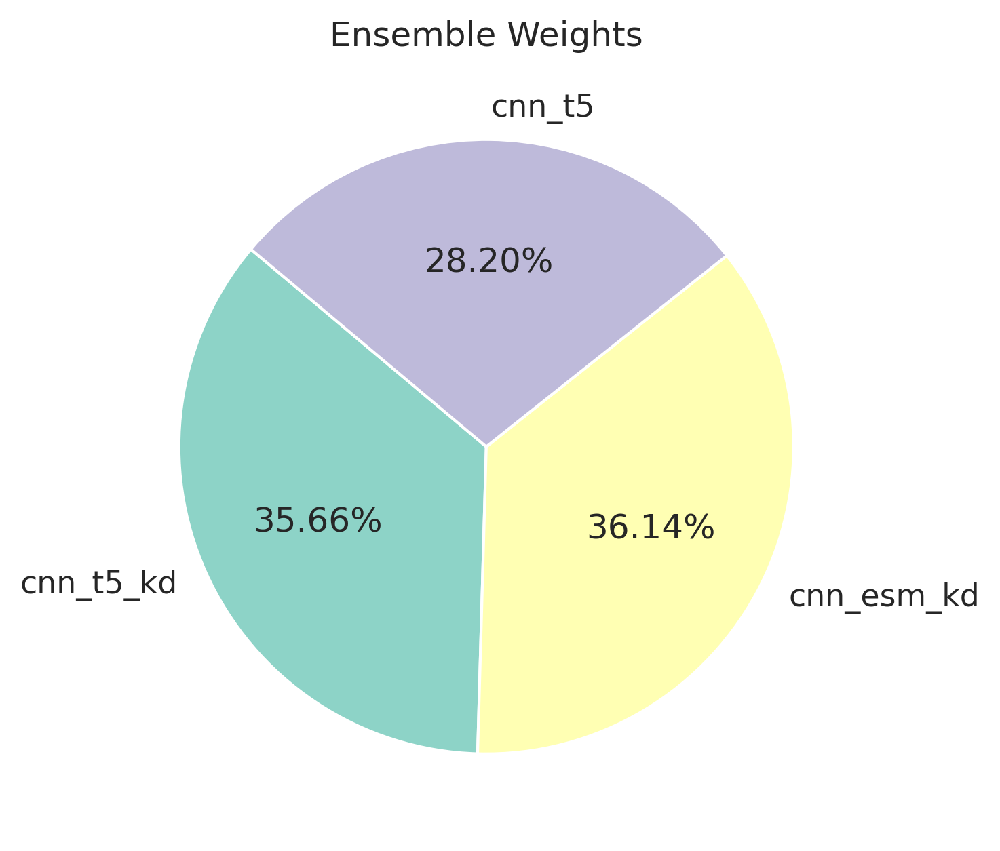

In [ ]:
# Pie Chart
labels = w2.model
sizes =  w2.weights

plt.figure(figsize=(5, 5))
plt.pie(sizes, labels=labels, autopct='%1.2f%%', startangle=140, colors=sns.color_palette("Set3", len(w2)))
plt.title("Ensemble Weights")
plt.show()

As it looks to be an average of the three models, we'll take the average of them

In [ ]:
oof_ensemble = None

for key in oofs2:
    if oof_ensemble is None:
        # Initialize oof_ensemble with the first DataFrame
        oof_ensemble = oofs2[key].copy()
    else:
        # Add subsequent DataFrames to oof_ensemble
        oof_ensemble += oofs2[key]
        
oof_ensemble /= len(oofs2)


In [ ]:
oof_ensemble

,-5P,-5G,-5A,-5C,-5S,-5T,-5V,-5I,-5L,-5M,-5F,-5Y,-5W,-5H,-5K,-5R,-5Q,-5N,-5D,-5E,-5s,-5t,-5y,-4P,-4G,-4A,-4C,-4S,-4T,-4V,-4I,-4L,-4M,-4F,-4Y,-4W,-4H,-4K,-4R,-4Q,-4N,-4D,-4E,-4s,-4t,-4y,-3P,-3G,-3A,-3C,-3S,-3T,-3V,-3I,-3L,-3M,-3F,-3Y,-3W,-3H,-3K,-3R,-3Q,-3N,-3D,-3E,-3s,-3t,-3y,-2P,-2G,-2A,-2C,-2S,-2T,-2V,-2I,-2L,-2M,-2F,-2Y,-2W,-2H,-2K,-2R,-2Q,-2N,-2D,-2E,-2s,-2t,-2y,-1P,-1G,-1A,-1C,-1S,-1T,-1V,-1I,-1L,-1M,-1F,-1Y,-1W,-1H,-1K,-1R,-1Q,-1N,-1D,-1E,-1s,-1t,-1y,1P,1G,1A,1C,1S,1T,1V,1I,1L,1M,1F,1Y,1W,1H,1K,1R,1Q,1N,1D,1E,1s,1t,1y,2P,2G,2A,2C,2S,2T,2V,2I,2L,2M,2F,2Y,2W,2H,2K,2R,2Q,2N,2D,2E,2s,2t,2y,3P,3G,3A,3C,3S,3T,3V,3I,3L,3M,3F,3Y,3W,3H,3K,3R,3Q,3N,3D,3E,3s,3t,3y,4P,4G,4A,4C,4S,4T,4V,4I,4L,4M,4F,4Y,4W,4H,4K,4R,4Q,4N,4D,4E,4s,4t,4y,0s,0t,0y
kinase,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SRC,0.111408,0.583648,0.710828,-0.990975,-0.203719,-0.728716,-0.094272,0.113296,0.726377,-1.028841,-0.678297,-1.289451,-1.018240,-0.819849,1.007133,0.359931,0.808003,0.085564,1.615073,2.646581,-0.438668,-0.833242,-0.366031,0.015112,1.277911,0.422821,-0.895288,-0.403364,-0.674460,0.221451,-0.251802,1.047126,-0.896940,-0.468431,-1.355842,-1.338285,-0.757110,0.332388,0.341049,-0.222689,-0.287103,1.674551,2.545985,0.791719,-0.724163,-0.516752,-0.013018,1.122497,0.998910,-1.156600,-0.808594,-0.930239,0.217345,-0.444893,0.391072,-1.061177,-0.710498,-1.431360,-1.320621,-0.506064,0.853723,0.226831,0.338764,-0.246193,1.744706,3.159728,0.097288,-0.644157,-0.017382,0.938038,1.289586,0.574383,-1.107985,-0.782215,-0.863116,0.021290,-0.295982,0.107569,-1.099268,-0.844070,-1.441048,-1.244957,-0.938385,0.326891,-0.446294,0.373023,0.423606,2.158792,2.482301,0.580123,-0.409585,0.145570,-0.068031,-0.044822,0.687743,-1.116483,-1.196849,-0.843280,2.169062,1.812480,1.985229,-1.216622,-0.178264,-1.447761,-1.194707,-0.681919,-0.041914,-0.706029,-0.398510,-0.304023,0.653103,2.381468,-0.342613,0.014100,0.192729,-0.928478,2.438068,1.035140,-0.910212,-0.869948,-1.135025,0.604544,0.008241,0.184560,-0.880901,-0.710902,-1.398275,-0.638530,-0.751798,0.239619,-0.783436,0.104381,-0.072425,2.028548,3.288711,0.172151,-0.639310,-0.021484,-0.088619,0.666015,1.153555,-0.831241,-0.756580,-1.059390,0.916672,-0.068686,0.930780,-0.845967,-0.229590,-1.350068,-0.943068,-0.884472,-0.069076,-0.139249,-0.160877,0.037385,1.611852,2.298028,0.219148,-0.349057,-0.059108,0.739630,0.731355,0.638917,-0.820583,-0.866778,-1.060487,0.479112,0.403615,2.946979,-0.946670,-0.199254,-1.338927,-1.122242,-0.726307,0.460462,1.377474,-0.493267,-0.542408,0.603873,0.610115,-0.129208,-0.602597,-0.112709,0.454424,0.908791,0.868969,-0.960290,-0.417640,-0.840857,0.874806,-0.460917,0.659345,-0.884704,-0.420624,-1.191767,-1.244049,-0.741383,1.263716,0.911834,-0.125902,0.112405,0.978289,1.506031,-0.305225,-0.304170,-0.594465,-0.787241,-0.636806,1.458532
EPHA3,0.011652,0.532787,0.834113,-1.036712,0.031884,-0.727852,0.090668,0.114720,0.973926,-1.088638,-0.560409,-0.730475,-1.091816,-0.803115,1.342097,0.503493,0.293383,0.172785,1.152661,1.863179,-0.554631,-0.855975,-0.344712,0.076136,1.229490,0.172135,-0.986001,-0.318628,-0.655972,0.251719,-0.179301,1.240613,-0.854058,-0.408468,-1.335979,-1.286775,-0.827745,0.694542,0.797435,-0.142159,-0.163771,1.793282,1.478461,0.702199,-0.744031,-0.678790,0.043938,1.117502,1.001100,-1.216077,-0.786983,-0.891978,0.336648,-0.111109,0.627222,-1.083638,-0.546758,-1.282537,-1.278571,-0.541716,1.090696,0.054466,0.226322,-0.132038,1.397976,2.118318,0.096616,-0.489126,0.044935,0.294810,0.917235,0.715203,-1.125646,-0.783996,-1.020491,0.029308,-0.055489,0.131068,-1.097885,-0.852004,-1.371778,-1.030214,-0.993831,1.773781,0.068204,0.362098,-0.052798,1.315933,2.304655,0.539216,-0.429888,0.178650,-0.479884,-0.174138,0.439839,-1.163714,-1.096832,-0.976258,1.168023,0.834170,1.829775,-1.363730,-0.394064,-1.344908,-1.252679,-0.954178,-0.12201

## Plot

In [ ]:
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
sns.set_context('notebook')
sns.set_style("ticks")

In [ ]:
y=t5[target_col]

In [ ]:
y.index=t5.kinase

In [ ]:
corr = oof_ensemble.corrwith(y,axis=1).reset_index(name='pearson')

In [ ]:
corr = oof_ensemble.iloc[:,:-3].corrwith(y.iloc[:,:-3],axis=1).reset_index(name='pearson')

In [ ]:
corr = corr.merge(info,'left')

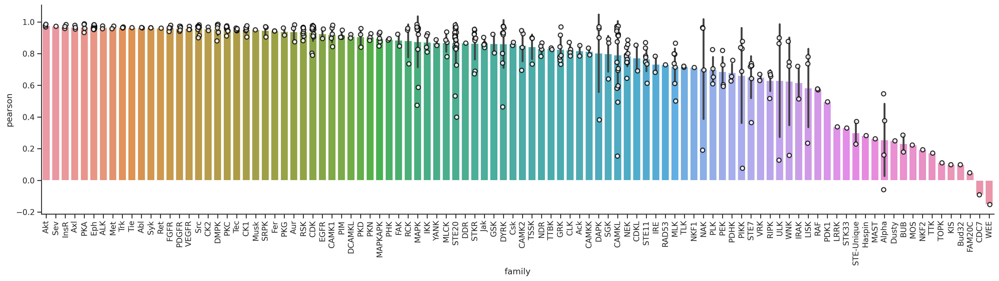

In [ ]:
plot_bar(corr,'pearson','family',rotation=90,aspect=4)

Tyrosine kinase always has a pattern of D and E across positions and L on +3

In [ ]:
corr[corr.group=='TK'].kinase[:20]

0       SRC
1     EPHA3
2       FES
3     NTRK3
4       ALK
5     EPHA8
6      ABL1
7      FLT3
8     EPHB2
9       FYN
10      RET
11    EPHB1
12     MUSK
13     INSR
14    EPHB3
15      FER
16    EPHB4
17    NTRK1
18     ROS1
19    TYRO3
Name: kinase, dtype: object

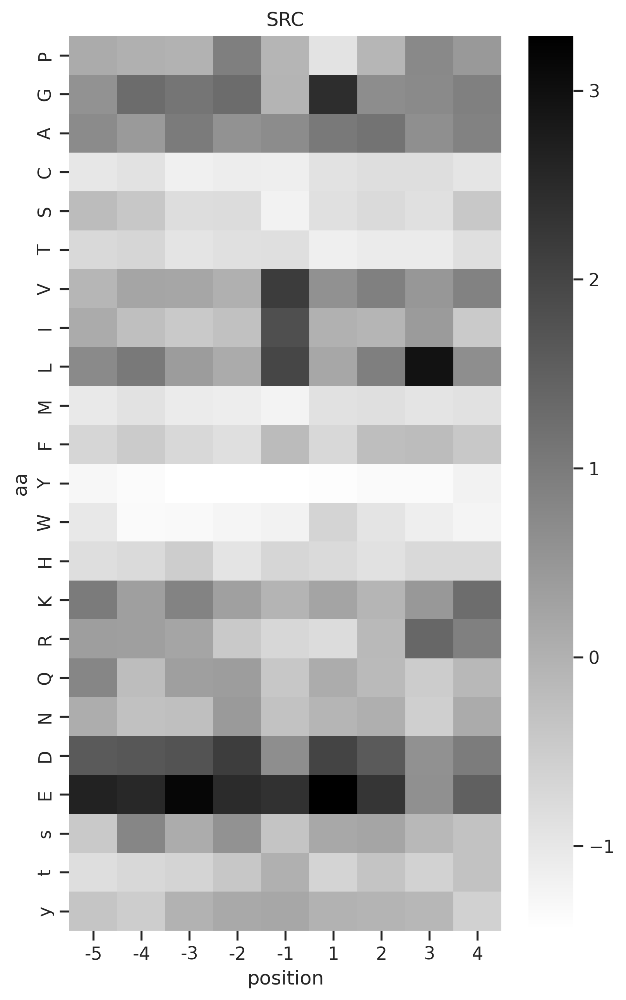

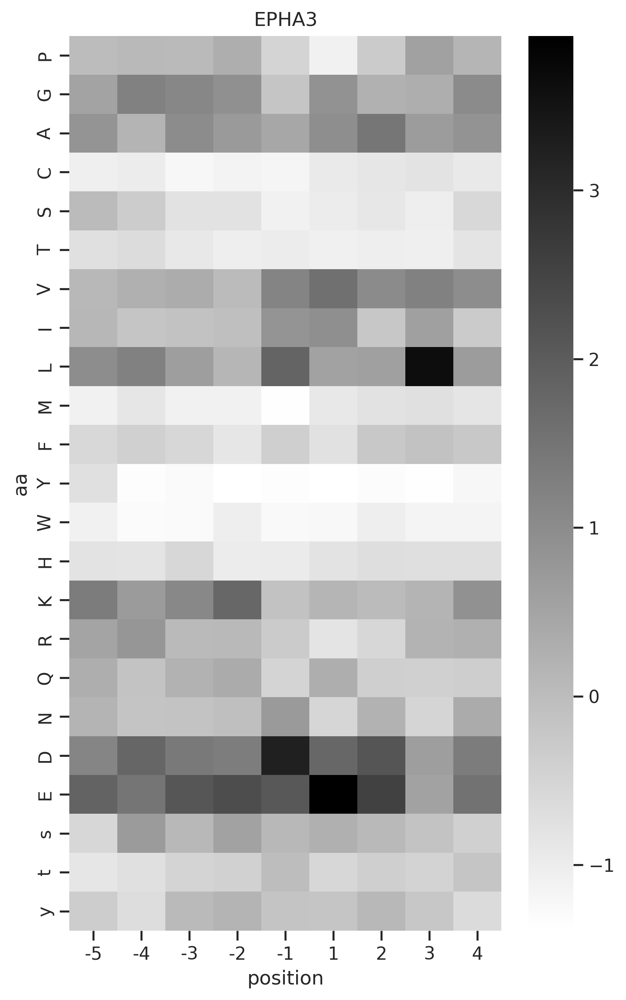

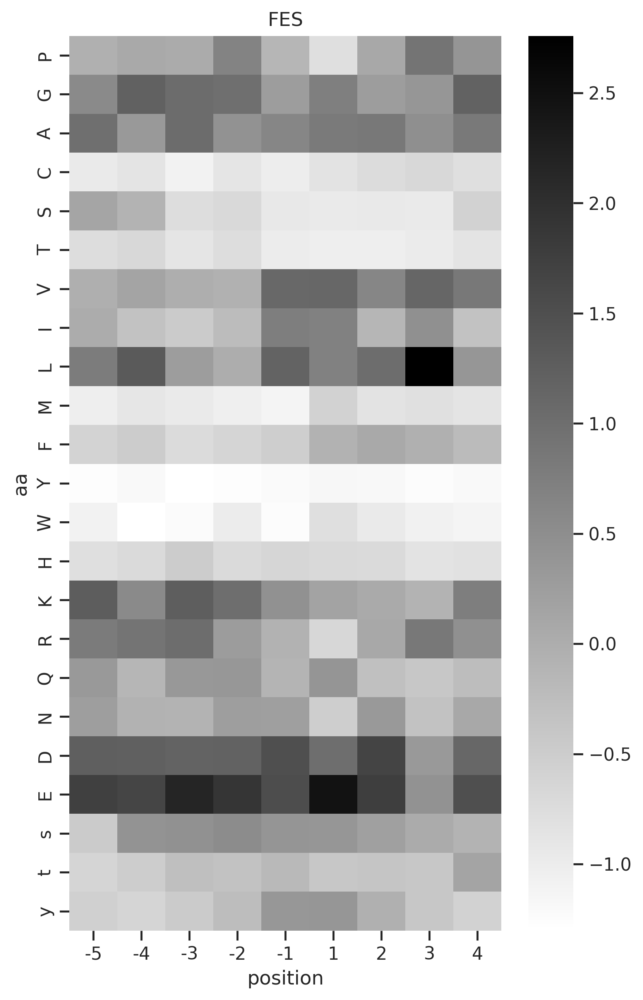

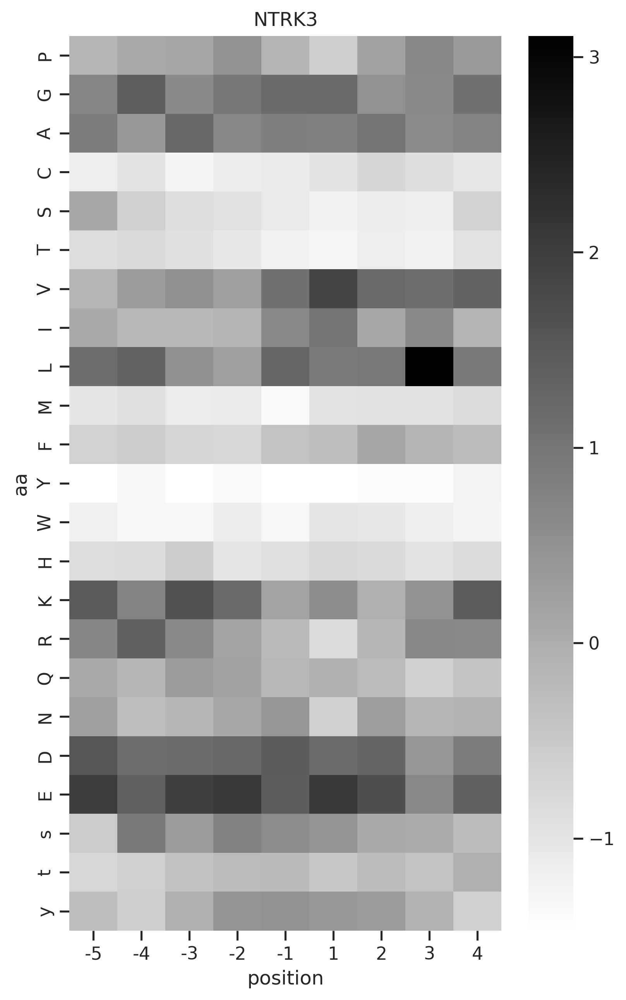

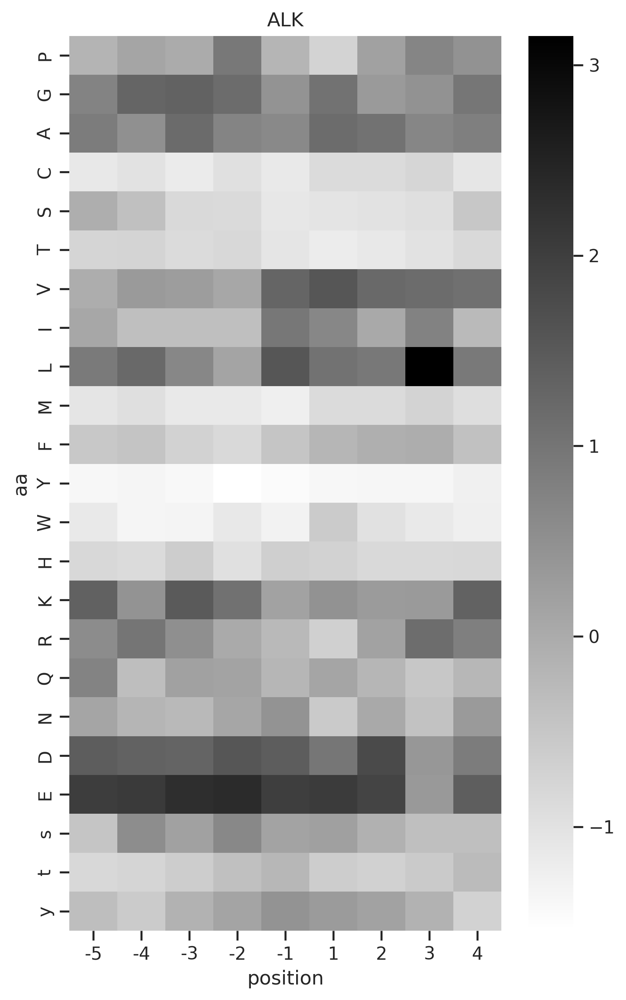

...

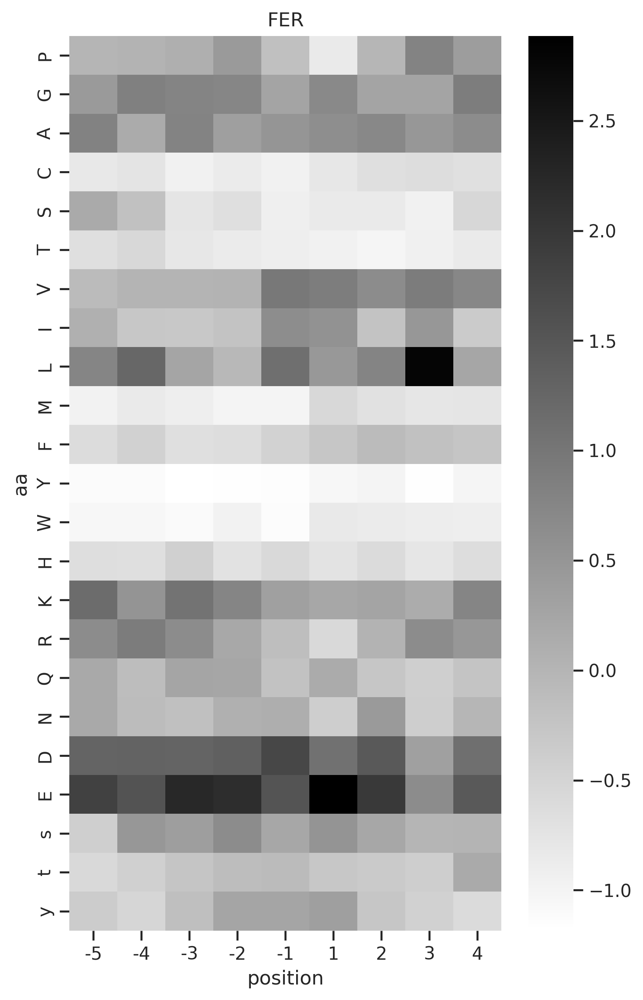

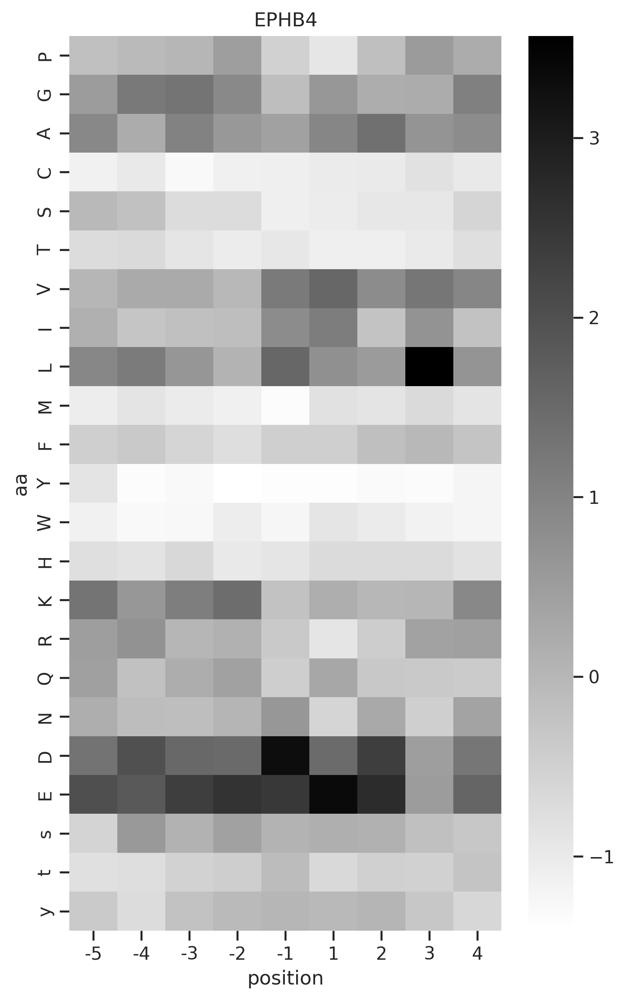

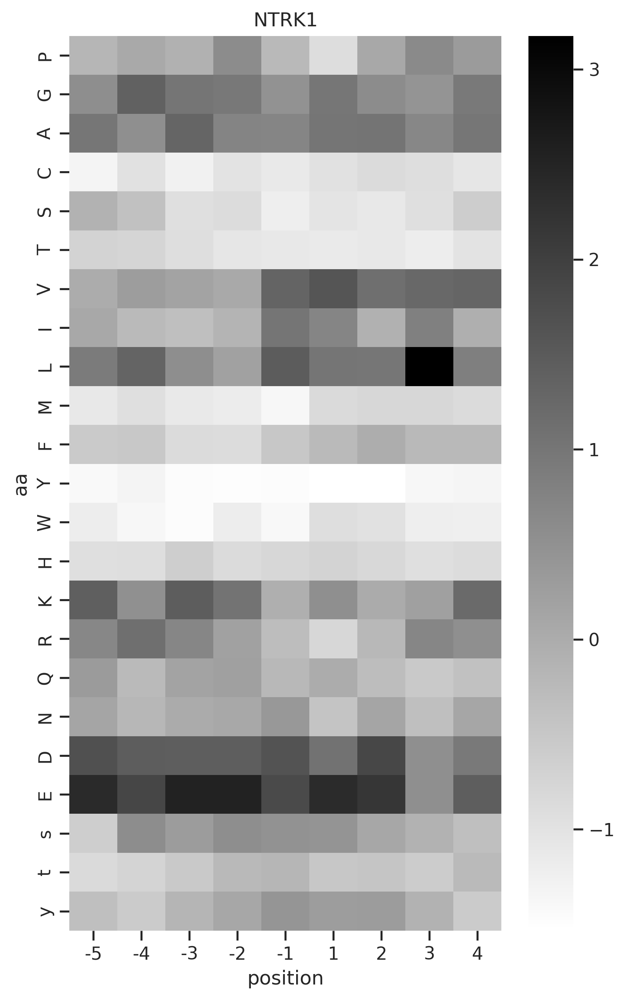

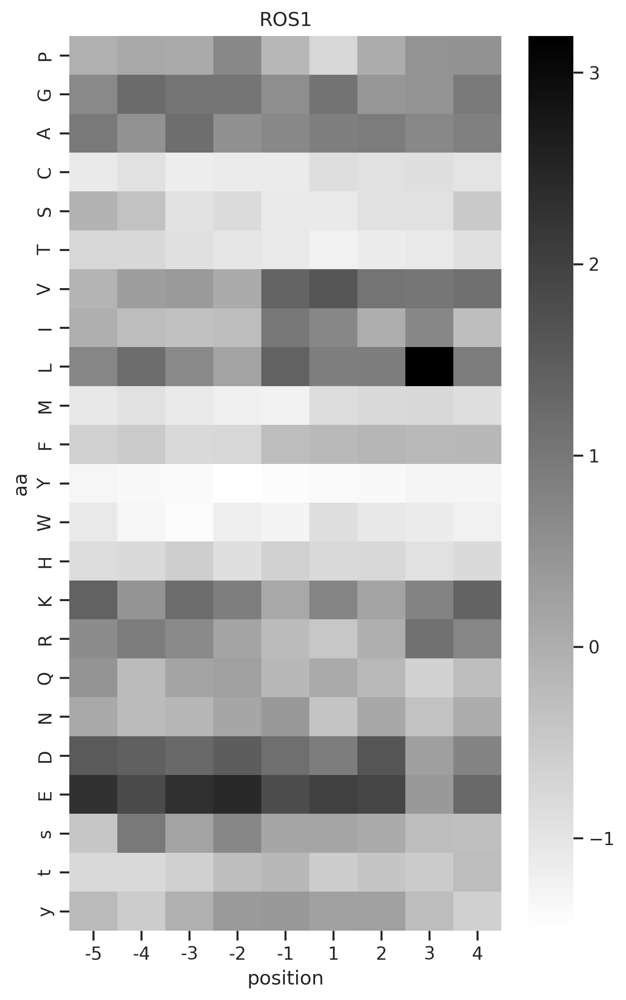

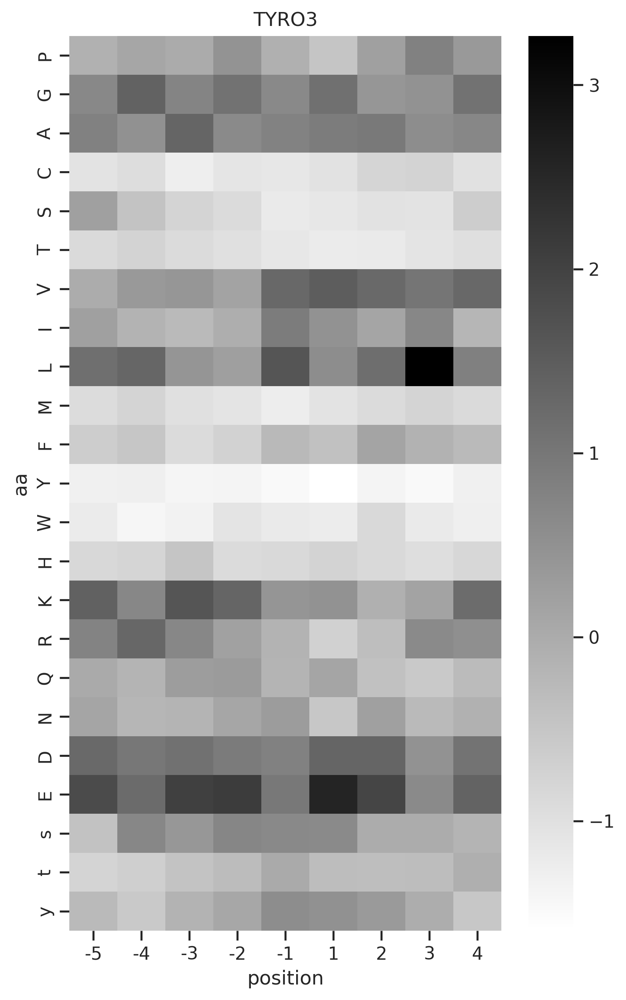

In [ ]:
for k in corr[corr.group=='TK'].kinase[:20]:
    get_heatmap2(oof_ensemble.iloc[:,:-3],k)
    # break
    plt.show()
    plt.close()

## Predict

In [ ]:
kinase = Data.get_kinase_info_full().query('pseudo==0')

In [ ]:
valid_uniprot = kinase[kinase.human_uniprot_sequence.str.len()<7000]

In [ ]:
valid_kd = kinase[kinase.kinasecom_domain.str.len()<7000]

In [ ]:
from katlas.feature import *

In [ ]:
feat_esm = get_esm(valid_uniprot,'human_uniprot_sequence')
feat_esm_kd = get_esm(valid_kd,'kinasecom_domain')

feat_t5 = get_t5(valid_uniprot,'human_uniprot_sequence')
feat_t5_kd = get_t5(valid_kd,'kinasecom_domain')

repr_layers number for model esm2_t33_650M_UR50D is 33.
You can also choose other esm2 models: 
esm2_t48_15B_UR50D
esm2_t36_3B_UR50D
esm2_t33_650M_UR50D
esm2_t30_150M_UR50D
esm2_t12_35M_UR50D
esm2_t6_8M_UR50D



  0%|          | 0/508 [00:00<?, ?it/s]

In [ ]:
feat_esm.index=valid_uniprot.kinase

feat_t5.index = valid_uniprot.kinase

feat_esm_kd.index = valid_kd.kinase
feat_t5_kd.index= valid_kd.kinase

In [ ]:
feat_esm.astype(float).to_parquet('raw/esm_unknown.parquet')
feat_esm_kd.astype(float).to_parquet('raw/esm_unknown_kd.parquet')

feat_t5.astype(float).to_parquet('raw/t5_unknown.parquet')
feat_t5_kd.astype(float).to_parquet('raw/t5_unknown_kd.parquet')

In [ ]:
feat_esm = pd.read_parquet('raw/esm_unknown.parquet')
feat_esm_kd = pd.read_parquet('raw/esm_unknown_kd.parquet')

feat_t5 = pd.read_parquet('raw/t5_unknown.parquet')
feat_t5_kd = pd.read_parquet('raw/t5_unknown_kd.parquet')

In [ ]:
feat_esm.shape,feat_esm_kd.shape,feat_t5.shape,feat_t5_kd.shape

((508, 1280), (503, 1280), (508, 1024), (503, 1024))

In [ ]:
def cnn_esm():
    return CNN1D_2(num_esm, num_target)

def cnn_t5():
    return CNN1D_2(num_t5, num_target)

def mlp_t5():
    return MLP_1(num_t5, num_target)

def mlp_esm():
    return MLP_1(num_esm, num_target)

## Ensemble

5 Fold x 3 models = 15 models

In [ ]:
top = ['cnn_esm_kd',
'cnn_t5_kd',
'cnn_t5',
# 'mlp_t5',
      ]

In [ ]:
pred_list = []
for i in range(5):
    
    # model cnn esm kd
    pred1 = predict_dl(feat_esm_kd,esm_col,cnn_esm(),f'cnn_esm_kd_fold{i}_best')
    pred1.index = feat_esm_kd.index
    pred1.columns = y.columns
    pred_list.append(pred1)
    
    # model cnn t5 kd
    pred2 = predict_dl(feat_t5_kd,t5_col,cnn_t5(),f'cnn_t5_kd_fold{i}_best')
    pred2.index = feat_t5_kd.index
    pred2.columns = y.columns
    pred_list.append(pred2)
    
    # model cnn t5
    pred3 = predict_dl(feat_t5,t5_col,cnn_t5(),f'cnn_t5_fold{i}_best')
    pred3.index = feat_t5.index
    pred3.columns = y.columns
    pred_list.append(pred3)

/usr/local/lib/python3.9/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


In [ ]:
from functools import reduce


In [ ]:
preds = reduce(lambda x, y: x.add(y, fill_value=0), pred_list)

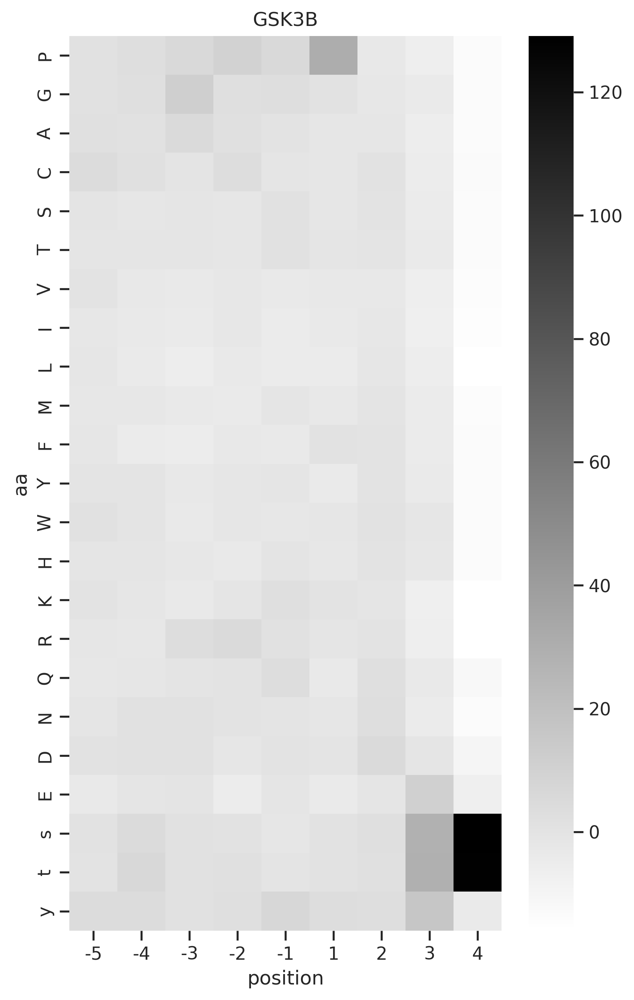

In [ ]:
get_heatmap2(preds.iloc[:,:-3],'GSK3B')

In [ ]:
# preds = pred1.add(pred2, fill_value=0).add(pred3, fill_value=0)

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
# preds = preds[~preds.index.isin(t5.kinase)]

In [ ]:
preds= preds[~preds.index.duplicated()]

In [ ]:
minmax = MinMaxScaler().fit_transform(preds.T).T

In [ ]:
data = []
for k in minmax.index:
    w = get_one_kinase(minmax,k,drop_s=False).T
    w = w/w.sum()
    w2 = w.unstack().reset_index(name=k)
    w2['substrate'] = w2.position.astype(str)+w2.aa
    w3 = w2.set_index('substrate')[k]
    data.append(w3)
    # break

In [ ]:
w = pd.concat(data,axis=1).T

w = w[target_col]

In [ ]:
w2 = w[~w.index.isin(t5.kinase)]

In [ ]:
w2.to_parquet('raw/predicted.parquet')

In [ ]:
order1 = w2.iloc[:,:-3].max(1).sort_values(ascending=False)

In [ ]:
order1

CDK20     0.425626
CDK15     0.425469
STK32A    0.398185
PRKY      0.396906
CDK11B    0.384517
            ...   
MLKL      0.107319
GUCY2F    0.106534
TESK2     0.102261
LMTK2     0.099545
TEX14     0.086788
Length: 119, dtype: float32

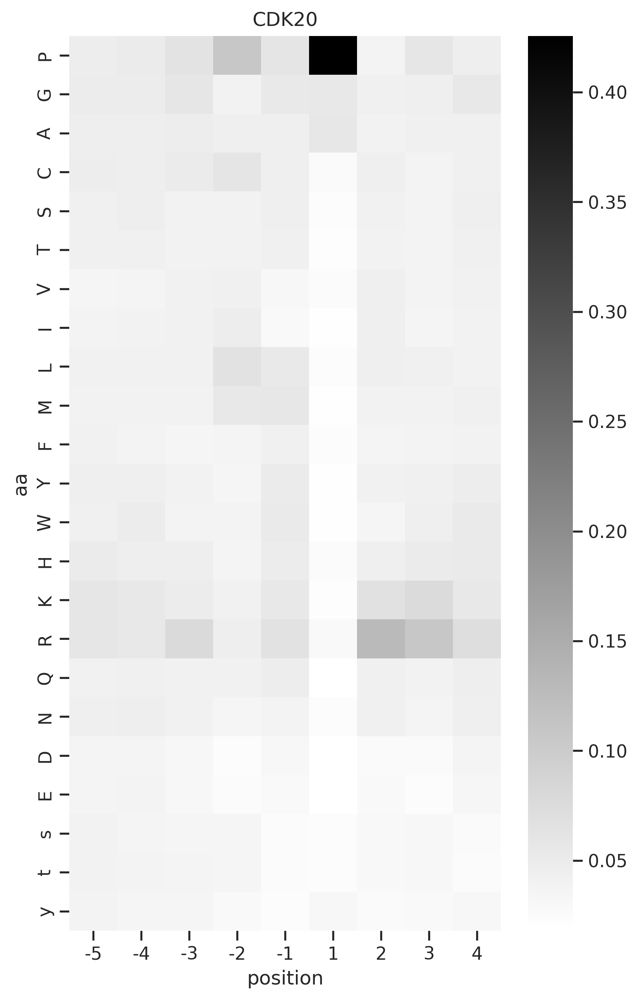

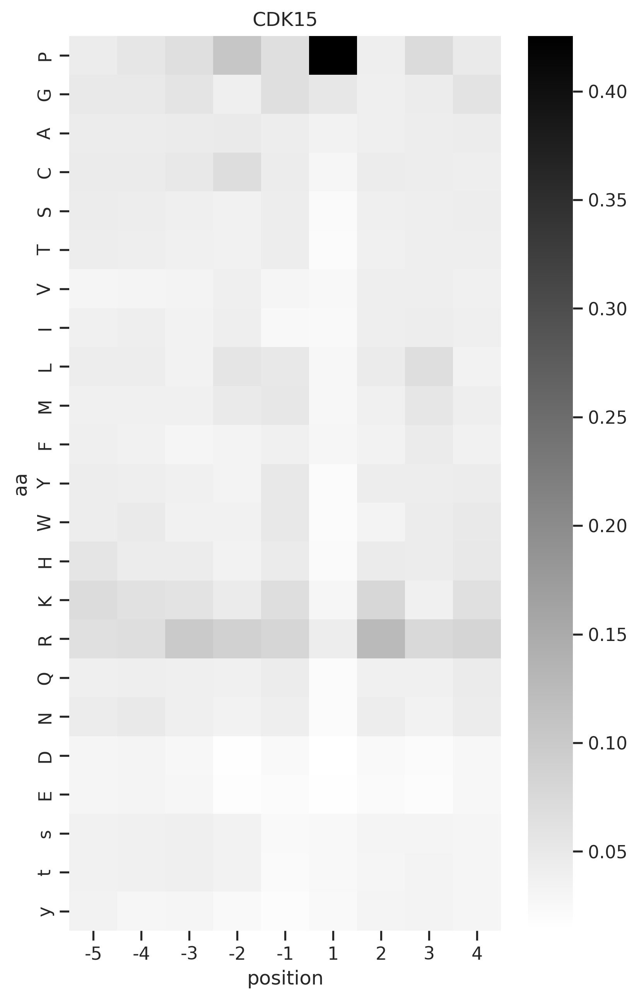

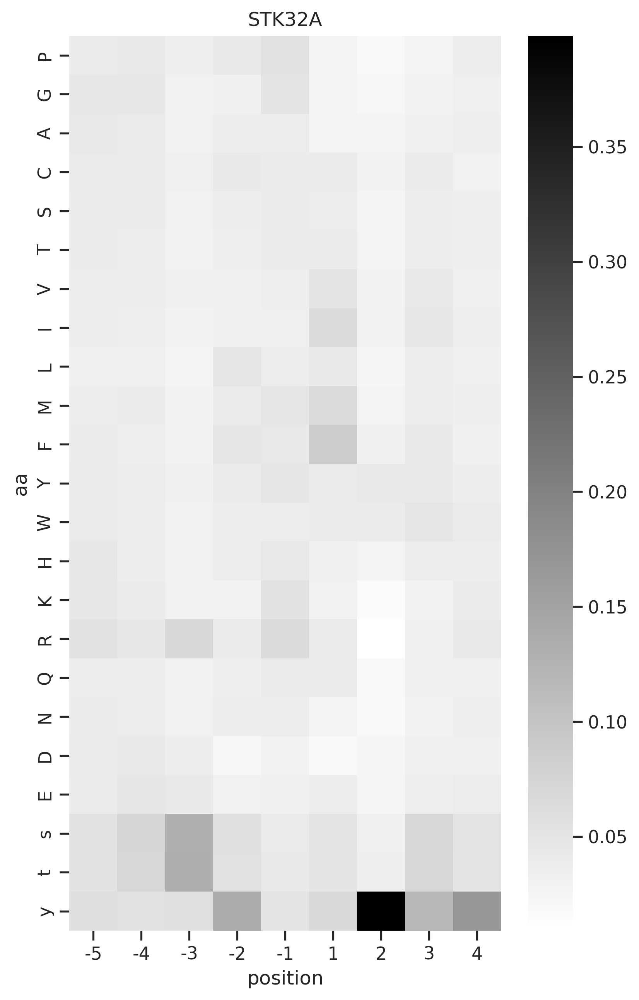

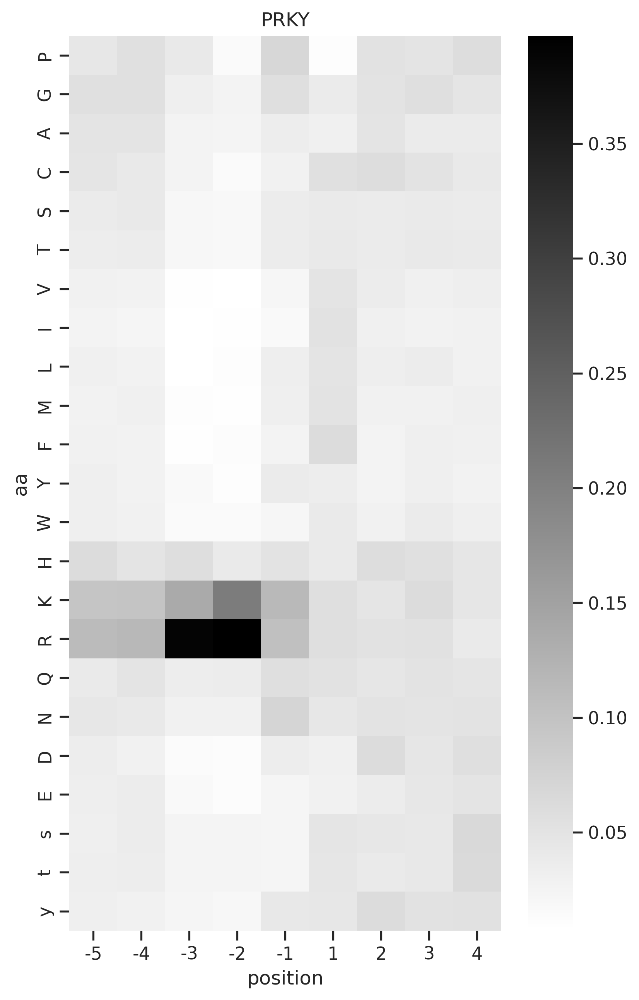

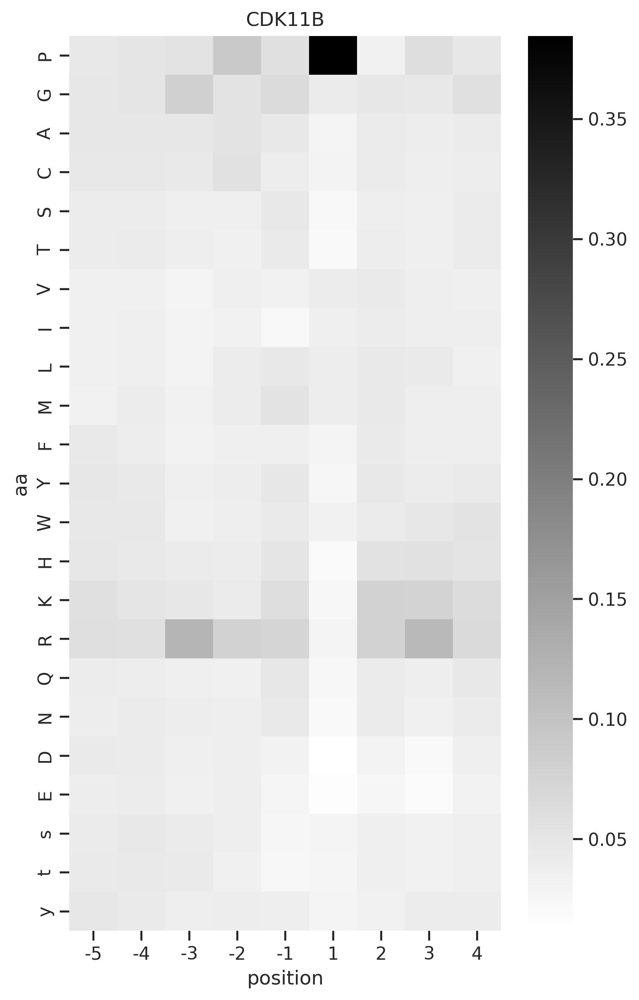

...

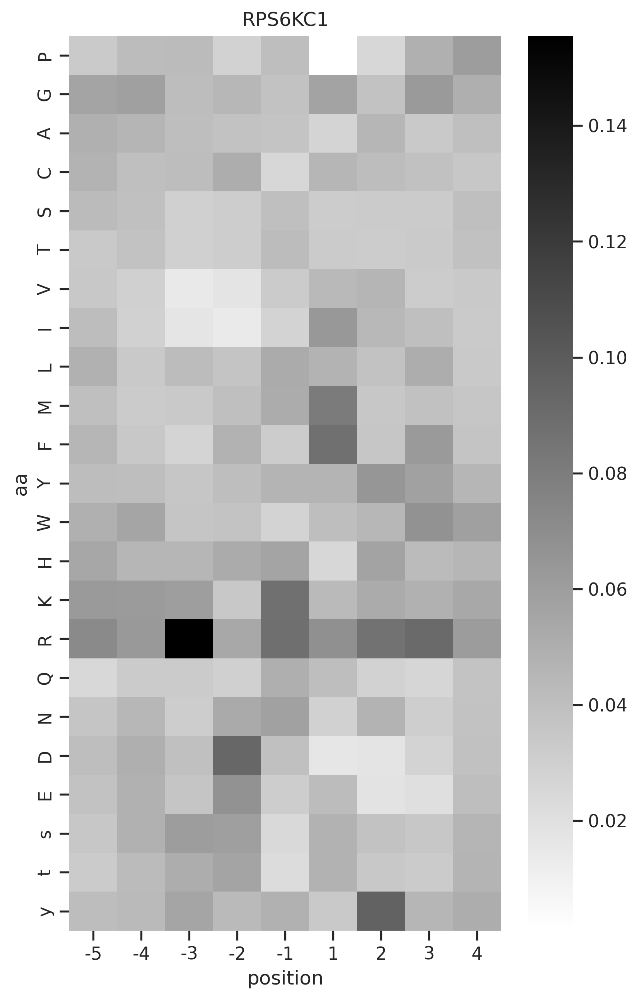

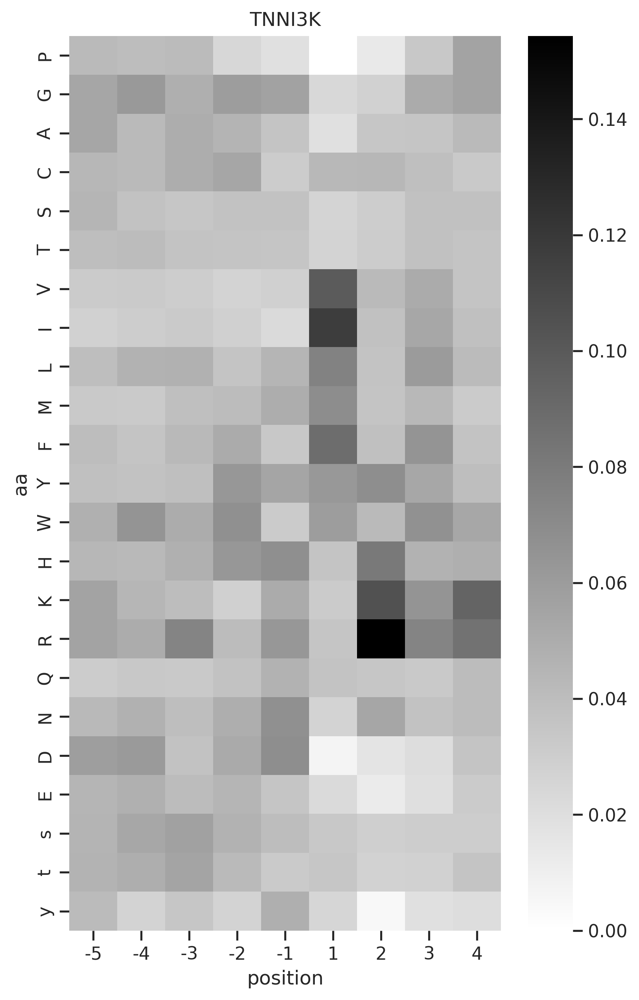

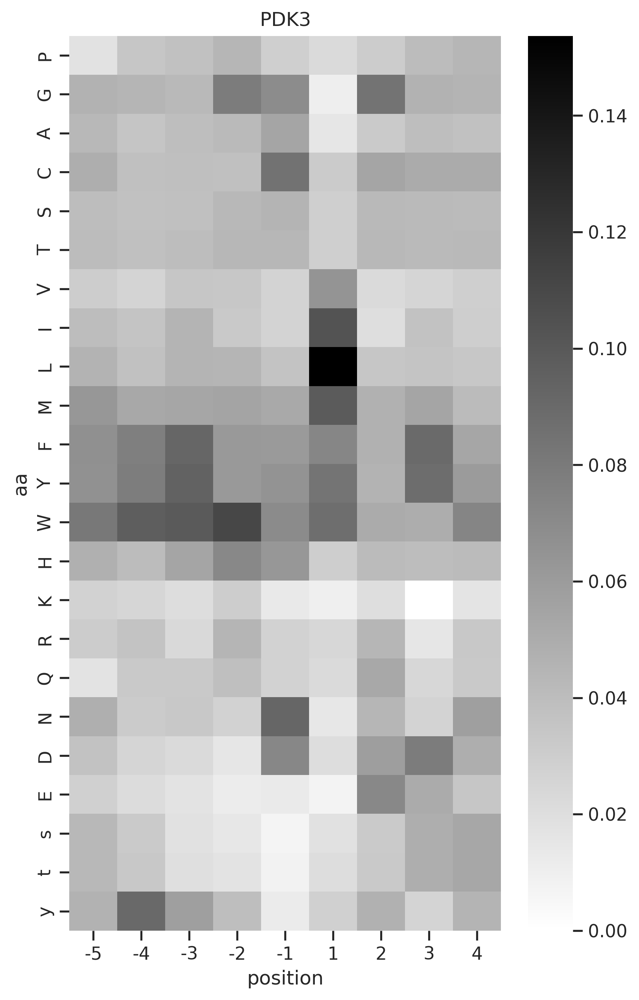

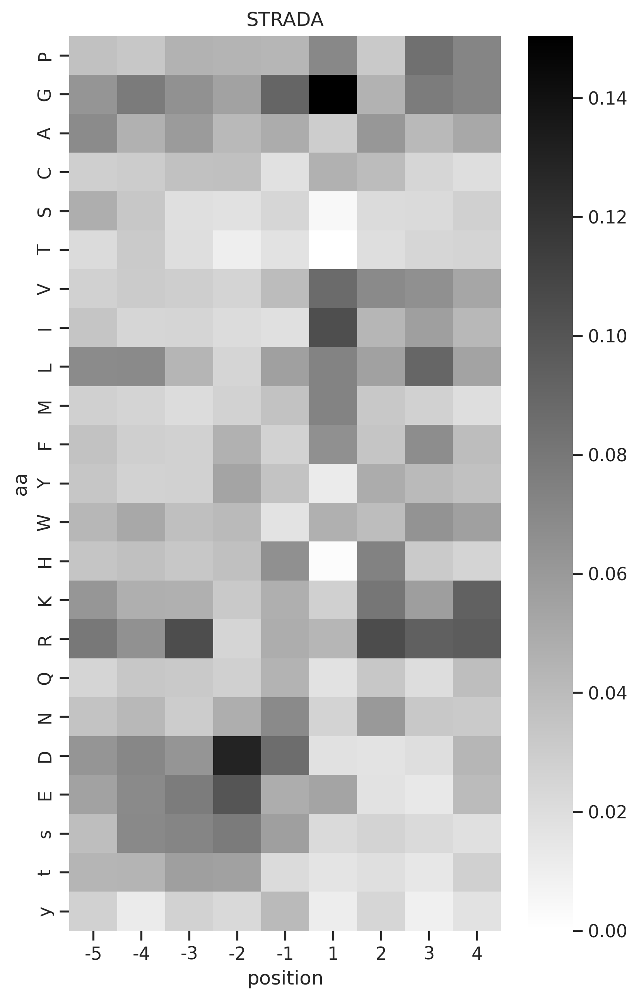

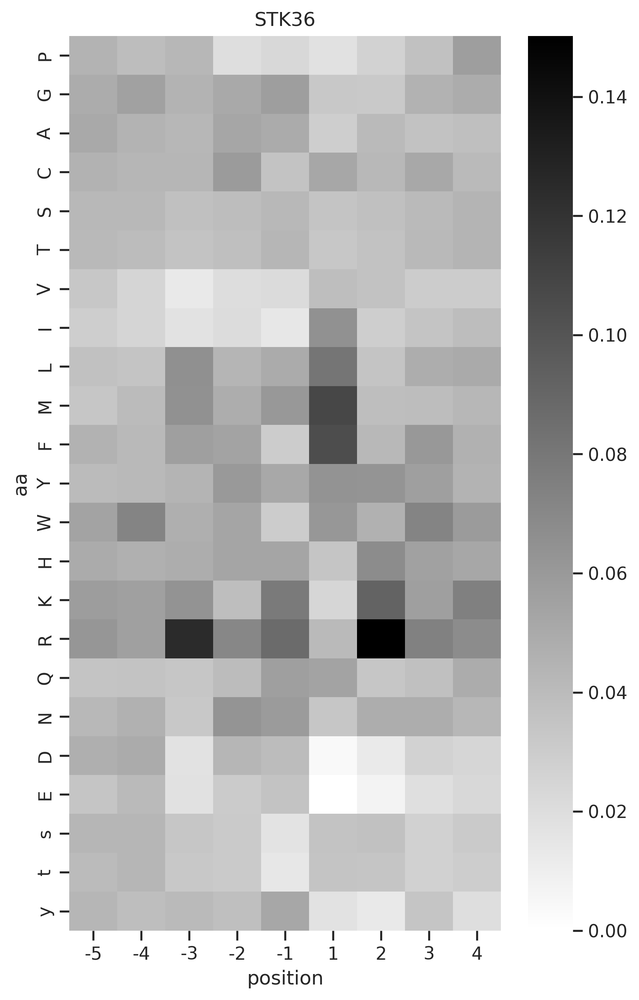

KeyboardInterrupt: 

In [ ]:
for k in order1[:100].index:
    get_heatmap2(w2.iloc[:,:-3],k)
    plt.show()
    plt.close()

In [ ]:
preds_info = pd.DataFrame(w2.index,columns=['kinase']).merge(kinase,'left')

preds_info = preds_info.merge(score_group,'left')

preds_info = preds_info.merge(score_family,'left')

preds_info = preds_info[['kinase','group','family','pearson_group','pearson_family']]

In [ ]:
order2 = preds_info[preds_info.pearson_family>0.6]\
.sort_values('pearson_family',ascending=False)\
.query('group!="TK"')

In [ ]:
len(order2)

38

One example

PKA:0.9662989205913761


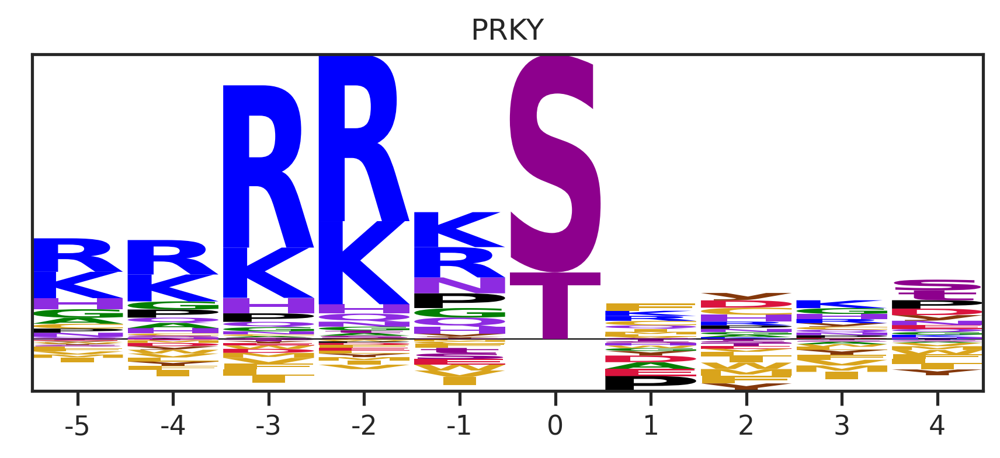

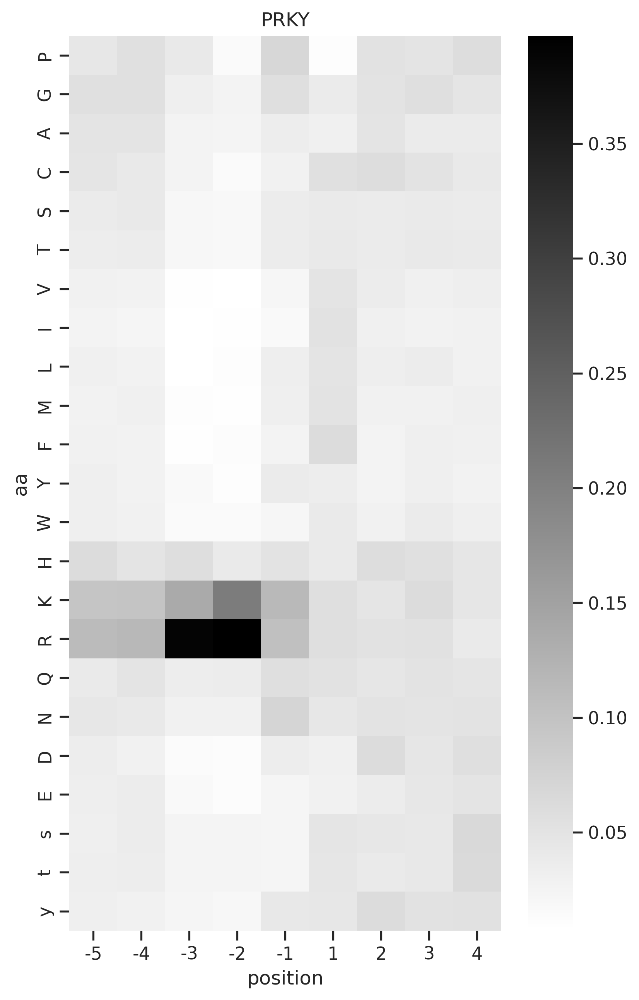

In [ ]:
for i,r in order2.iterrows():
    print(f'{r.family}:{r.pearson_family}')
    
    k = r.kinase
    matrix = get_one_kinase(w,k,drop_s=False).T
    get_logo2(matrix, k)
    # plt.savefig(f'predict/logo/{k}.png',bbox_inches='tight', pad_inches=0.3)
    plt.show()
    plt.close()
    
    get_heatmap2(w.iloc[:,:-3],k)
    # plt.savefig(f'predict/heatmap/{k}.png',bbox_inches='tight', pad_inches=0)
    plt.show()
    plt.close()
    break

In [ ]:
def get_heatmap3(df, # Stacked Dataframe with kinase as index, substrates as columns
                kinase # A specific kinase name in index
               ):
    aa_order = [i for i in 'PGACSTVILMFYWHKRQNDEsty']
    # position_order = [str(i) for i in range(-5,5)]
    # position_order.remove('0')
    
    kk = get_one_kinase(df, kinase,drop_s=False).T
    # kkk = kk.reindex(index=aa_order, columns=position_order)
    kkk = kk.reindex(index=aa_order)
    
    plt.figure(figsize=(7, 11))
    sns.heatmap(kkk, cmap='binary', annot=False)
    plt.title(kinase)

In [ ]:
for i,r in order2.iterrows():
    print(f'{r.family}:{r.pearson_family}')
    
    k = r.kinase
    matrix = get_one_kinase(w,k,drop_s=False).T
    get_logo2(matrix, k)
    plt.savefig(f'predict/logo/{k}.png',bbox_inches='tight', pad_inches=0.3) #0.3
    # plt.show()
    plt.close()
    
    get_heatmap3(w.iloc[:,:-3],k)
    plt.savefig(f'predict/heatmap/{k}.png',bbox_inches='tight', pad_inches=0)
    # plt.show()
    plt.close()
    # break

PKA:0.9662989205913761
DMPK:0.9537063718769515
CDK:0.9352448783330505
CDK:0.9352448783330505
CDK:0.9352448783330505
DCAMKL:0.9096586827705696
MAPK:0.8751633809675211
MAPK:0.8751633809675211
YANK:0.8694508573339683
MLCK:0.8685076709396513
STE20:0.8678303995469013
STE20:0.8678303995469013
STE20:0.8678303995469013
STKR:0.8648838200207909
STKR:0.8648838200207909
STKR:0.8648838200207909
TSSK:0.8431816428153404
TSSK:0.8431816428153404
DAPK:0.8027085722528202
NEK:0.7851892125640396
CDKL:0.7721674947465199
CDKL:0.7721674947465199
CDKL:0.7721674947465199
STE11:0.765495621049378
MLK:0.7177998215324827
MLK:0.7177998215324827
MLK:0.7177998215324827
NKF1:0.7130687775595442
NKF1:0.7130687775595442
PDHK:0.6800914306041554
PIKK:0.6622137723956179
STE7:0.6516941298534221
VRK:0.6498885601023676
RIPK:0.6302012947796487
ULK:0.630096161745191
ULK:0.630096161745191
IRAK:0.6167890811915591
IRAK:0.6167890811915591


In [ ]:
def combine_images_vertically(image_paths, output_path):
    images = [Image.open(image_path).convert('RGBA') for image_path in image_paths]
    
    total_width = max(image.width for image in images)
    total_height = sum(image.height for image in images)

    combined_image = Image.new('RGBA', (total_width, total_height))

    y_offset = 0
    for image in images:
        combined_image.paste(image, (0, y_offset), image)
        y_offset += image.height

    combined_image.save(output_path)

In [ ]:
from tqdm import tqdm

In [ ]:
folders = ["predict/logo", "predict/heatmap"]
for i,r in tqdm(order2.iterrows(),total=len(order2)):
    k = r.kinase
    filename = f"{k}.png"
    image_paths = [os.path.join(folder, filename) for folder in folders]
    output_path = f"predict/combine/{k}.png"
    
    combine_images_vertically(image_paths, output_path)
    # break

100%|██████████| 38/38 [00:14<00:00,  2.68it/s]


In [ ]:
# !zip -rq predict.zip predict/combine 

## Validate with KS dataset

In [ ]:
df = Data.get_ks_dataset()

In [ ]:
df = df[df.kinase.isin(w2.index)]

In [ ]:
def plot_count2(df_k,title):
    # Get value counts
    source_counts = df_k.source.replace({'pplus':'PP','large_scale':'LS'}).value_counts()
    plt.figure(figsize=(7,1))

    source_counts.plot(kind='barh', stacked=True, color=['darkred', 'darkblue'])
    # Annotate with the actual values
    for index, value in enumerate(source_counts):
        plt.text(value, index, str(value),fontsize=10,rotation=-90, va='center')

    plt.xlabel('Count')
    plt.title(title)

In [ ]:
df.kinase.value_counts()[:10]

MAP2K6     94
DDR1       81
TNNI3K     76
ERBB2      68
PDK3       67
ROR2       58
PKMYT1     54
MAST2      48
ROR1       44
MAP3K13    37
Name: kinase, dtype: int64

In [ ]:
k = 'MAP2K6'

In [ ]:
df_k = df.query(f'kinase=="{k}"').reset_index()

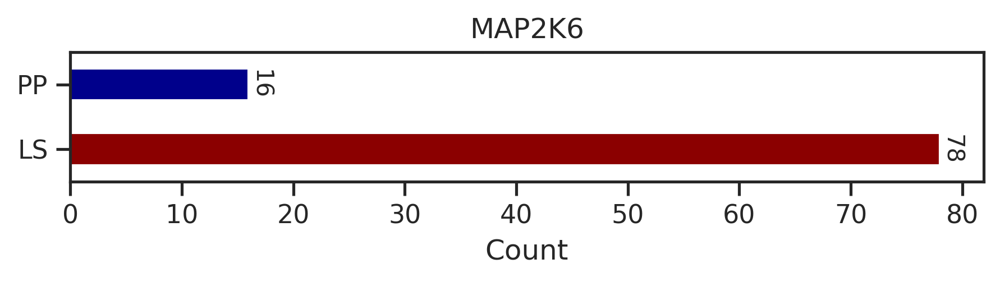

In [ ]:
plot_count2(df_k,k)

In [ ]:
paper,full = get_freq(df_k)

full = full[[i for i in range(-5,5)]]

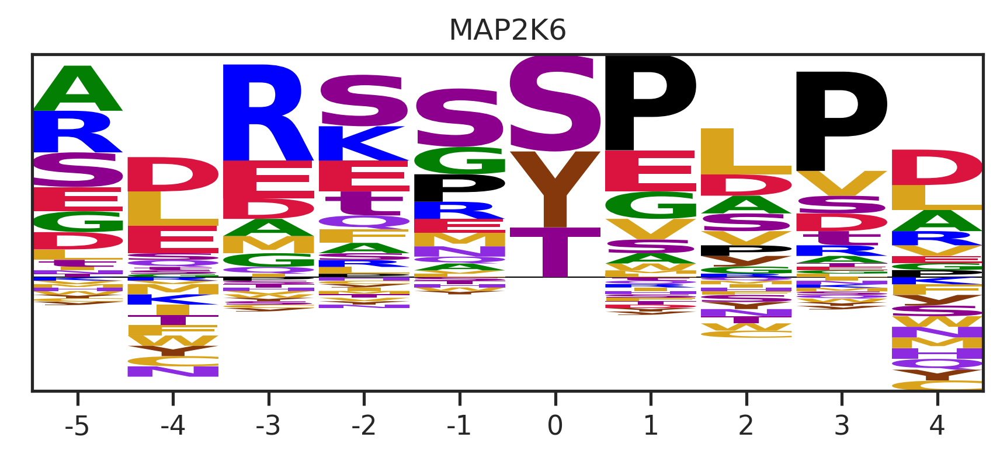

In [ ]:
get_logo2(full, k)

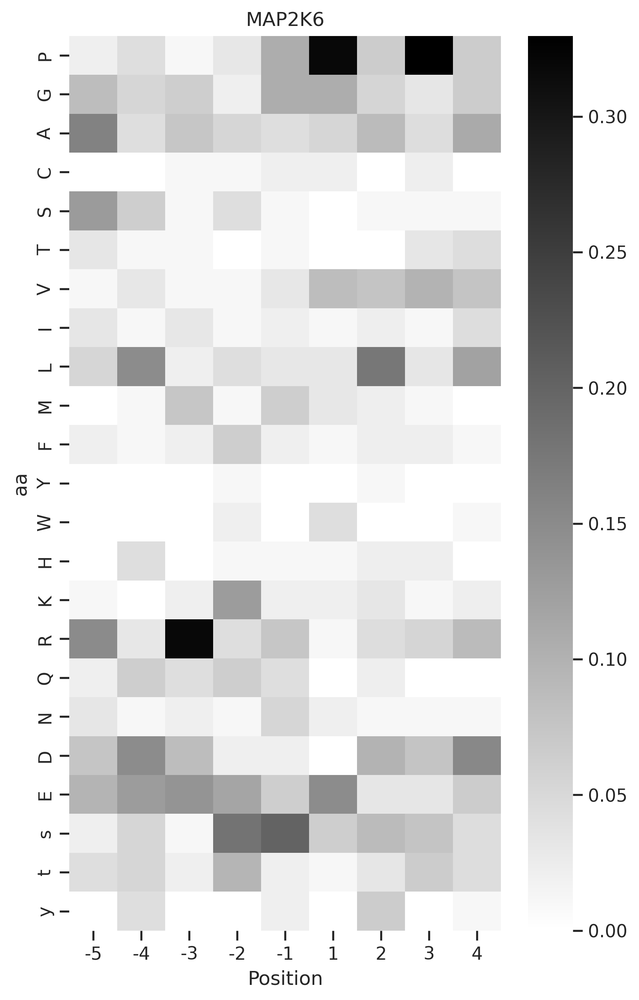

In [ ]:
plot_heatmap(paper, k)

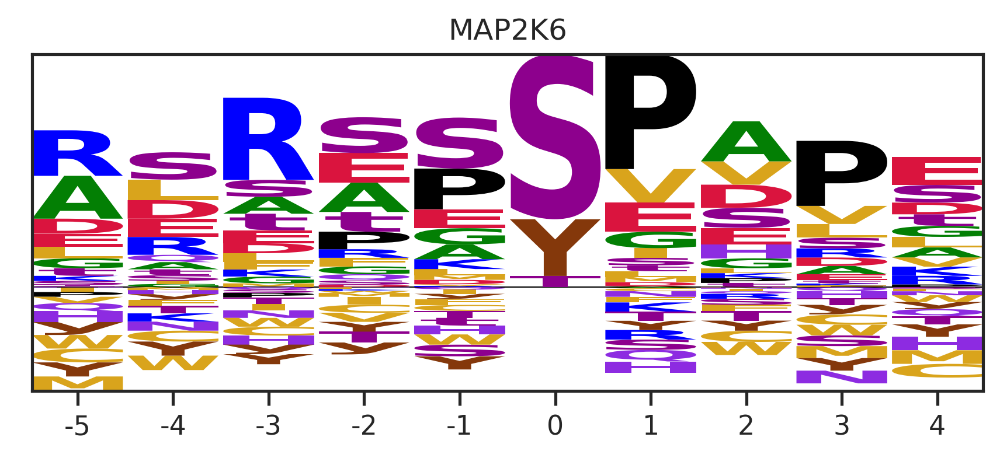

In [ ]:
matrix = get_one_kinase(w,k,drop_s=False).T

get_logo2(matrix, k)

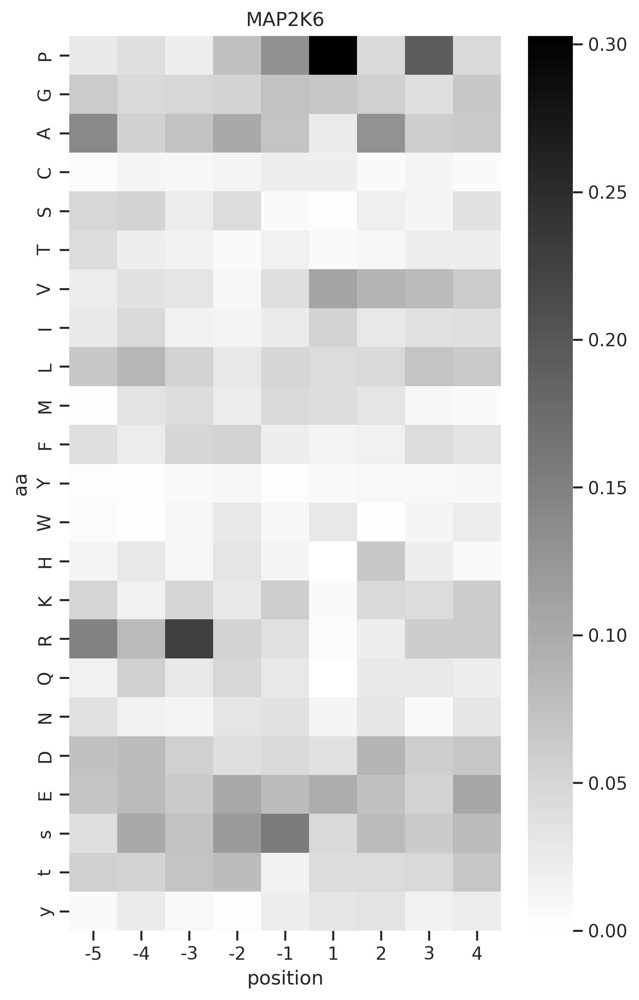

In [ ]:
get_heatmap2(w.iloc[:,:-3], k)